 # Insurance Claim Prediction and Factor Analysis Based on Machine Learning 
 ## - Comparative Study of Machine Learning Models

In [1]:
import pandas as pd

file_path_train = '/data/train.csv'
file_path_test = '/data/test.csv'
data_train = pd.read_csv(file_path_train)
data_test = pd.read_csv(file_path_test)

In [3]:
data_train.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
3,ID00004,0.900277,0.11,0.432692,C4,21622,1,C1,M2,Petrol,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
4,ID00005,0.596403,0.11,0.634615,C5,34738,2,A,M3,Petrol,...,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0


In [5]:
data_test.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating
0,ID58593,0.341732,0.00,0.586538,C3,4076,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0
1,ID58594,0.307241,0.13,0.442308,C8,8794,1,B2,M6,Petrol,...,0,1,1,1,1,1,1,1,1,2
2,ID58595,0.327924,0.12,0.451923,C8,8794,2,A,M3,Petrol,...,0,0,1,1,1,0,1,1,1,2
3,ID58596,0.782654,0.01,0.461538,C5,34738,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0
4,ID58597,1.233404,0.02,0.634615,C5,34738,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0


In [7]:
data_types = data_train.dtypes
#data_types = data_test.dtypes

# 各数据类型的数量统计
data_type_counts = data_types.value_counts()

# 显示每列的名称和对应的数据类型
data_type_overview = data_types.reset_index()
data_type_overview.columns = ['Column', 'Data Type']
print(data_type_overview)

# 输出各数据类型的统计
print("数据类型统计：")
print(data_type_counts)

                              Column Data Type
0                          policy_id    object
1                      policy_tenure   float64
2                         age_of_car   float64
3                age_of_policyholder   float64
4                       area_cluster    object
5                 population_density     int64
6                               make     int64
7                            segment    object
8                              model    object
9                          fuel_type    object
10                        max_torque    object
11                         max_power    object
12                       engine_type    object
13                           airbags     int64
14                            is_esc    object
15            is_adjustable_steering    object
16                           is_tpms    object
17                is_parking_sensors    object
18                 is_parking_camera    object
19                  rear_brakes_type    object
20           

In [9]:
#训练集情况
missing_values = data_train.isnull().sum() # 检测缺失值情况
missing_values_summary = missing_values[missing_values > 0].sort_values(ascending=False) # 统计缺失值的列及其缺失数量

print(missing_values_summary) # 打印缺失值信息

Series([], dtype: int64)


In [11]:
#测试集情况
missing_values = data_test.isnull().sum()
missing_values_summary = missing_values[missing_values > 0].sort_values(ascending=False)

print(missing_values_summary)

Series([], dtype: int64)


In [13]:
#训练集
numerical_columns = [ "policy_tenure", "age_of_car", "age_of_policyholder", "population_density",
                     "turning_radius", "length", "width", "height", "gross_weight"]
numerical_summary_train = data_train[numerical_columns].describe().transpose() # 对数值型数据进行描述性统计
numerical_summary_train

,count,mean,std,min,25%,50%,75%,max
policy_tenure,58592.0,0.611246,0.414156,0.002735,0.210250,0.573792,1.039104,1.396641
age_of_car,58592.0,0.069424,0.056721,0.000000,0.020000,0.060000,0.110000,1.000000
age_of_policyholder,58592.0,0.469420,0.122886,0.288462,0.365385,0.451923,0.548077,1.000000
population_density,58592.0,18826.858667,17660.174792,290.000000,6112.000000,8794.000000,27003.000000,73430.000000
turning_radius,58592.0,4.852893,0.228061,4.500000,4.600000,4.800000,5.000000,5.200000
length,58592.0,3850.476891,311.457119,3445.000000,3445.000000,3845.000000,3995.000000,4300.000000
width,58592.0,1672.233667,112.089135,1475.000000,1515.000000,1735.000000,1755.000000,1811.000000
height,58592.0,1553.335370,79.622270,1475.000000,1475.000000,1530.000000,1635.000000,1825.000000
gross_weight,58592.0,1385.276813,212.423085,1051.000000,1185.000000,1335.000000,1510.000000,1720.000000


In [15]:
#测试集
numerical_columns = [ "policy_tenure", "age_of_car", "age_of_policyholder", "population_density",
                     "turning_radius", "length", "width", "height", "gross_weight"]
numerical_summary_test = data_test[numerical_columns].describe().transpose() # 对数值型数据进行描述性统计
numerical_summary_test

,count,mean,std,min,25%,50%,75%,max
policy_tenure,39063.0,0.611304,0.415005,0.002745,0.208958,0.574078,1.040936,1.391398
age_of_car,39063.0,0.069635,0.056854,0.000000,0.020000,0.060000,0.110000,1.000000
age_of_policyholder,39063.0,0.469087,0.122072,0.288462,0.375000,0.451923,0.548077,0.990385
population_density,39063.0,18816.232496,17651.942351,290.000000,6112.000000,8794.000000,27003.000000,73430.000000
turning_radius,39063.0,4.853222,0.228060,4.500000,4.600000,4.800000,5.000000,5.200000
length,39063.0,3849.328981,312.181174,3445.000000,3445.000000,3845.000000,3995.000000,4300.000000
width,39063.0,1671.774979,111.973404,1475.000000,1515.000000,1735.000000,1755.000000,1811.000000
height,39063.0,1553.033203,79.030425,1475.000000,1475.000000,1530.000000,1635.000000,1825.000000
gross_weight,39063.0,1384.501677,212.724627,1051.000000,1185.000000,1335.000000,1510.000000,1720.000000


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

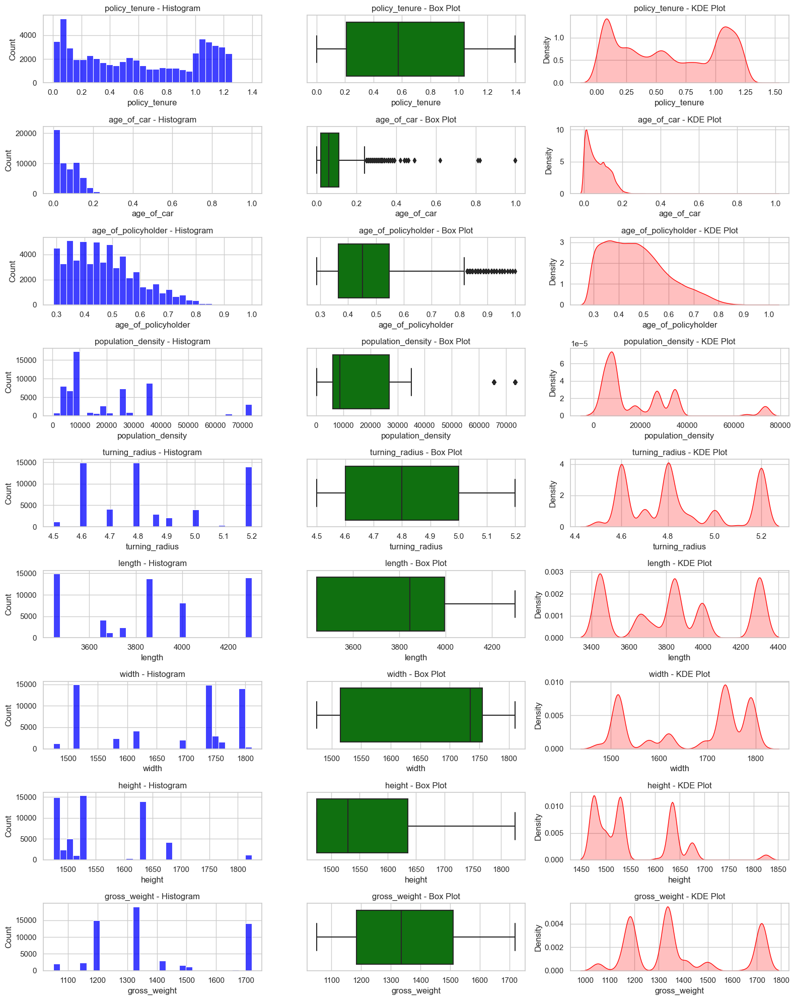

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

#训练集
sns.set(style='whitegrid')
plt.figure(figsize=(16,20))

for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 3, 3 * i + 1)
    sns.histplot(data_train[column], kde=False, bins=30, color='blue')
    plt.title(f'{column} - Histogram')

    plt.subplot(len(numerical_columns), 3, 3 * i + 2)
    sns.boxplot(x=data_train[column], color='green')
    plt.title(f'{column} - Box Plot')

    plt.subplot(len(numerical_columns), 3, 3 * i + 3)
    sns.kdeplot(data_train[column], fill=True, color='red')
    plt.title(f'{column} - KDE Plot')

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

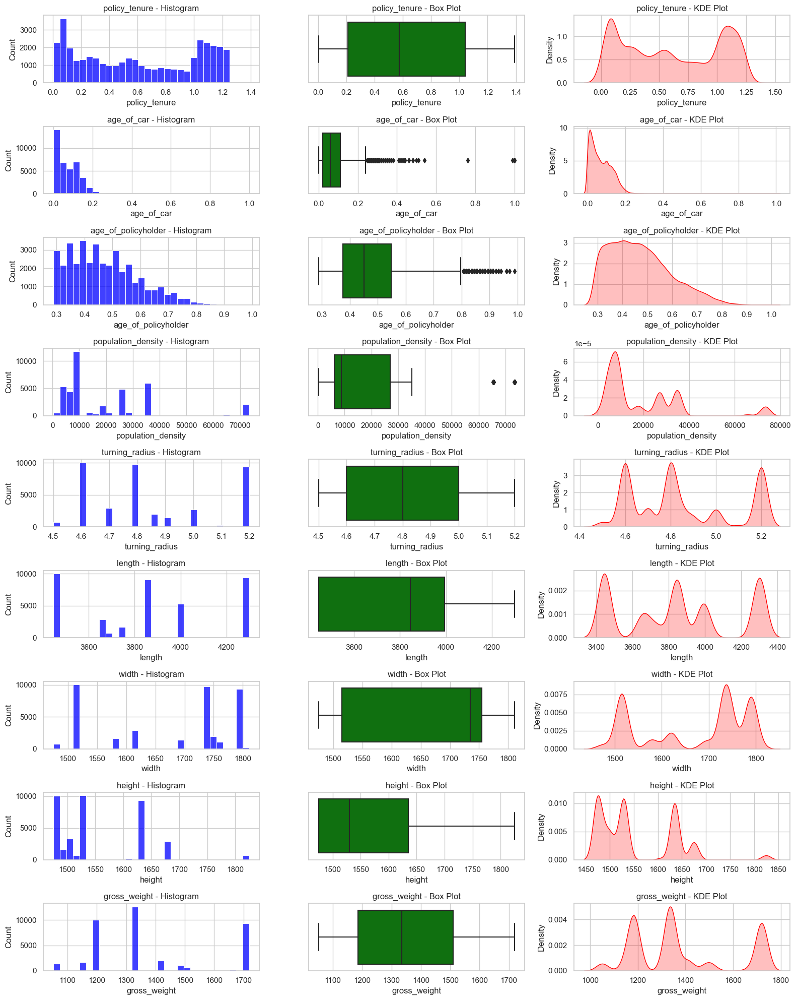

In [19]:
#测试集
sns.set(style='whitegrid')
plt.figure(figsize=(16,20))

for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 3, 3 * i + 1)
    sns.histplot(data_test[column], kde=False, bins=30, color='blue')
    plt.title(f'{column} - Histogram')

    plt.subplot(len(numerical_columns), 3, 3 * i + 2)
    sns.boxplot(x=data_test[column], color='green')
    plt.title(f'{column} - Box Plot')

    plt.subplot(len(numerical_columns), 3, 3 * i + 3)
    sns.kdeplot(data_test[column], fill=True, color='red')
    plt.title(f'{column} - KDE Plot')

plt.tight_layout()
plt.show()

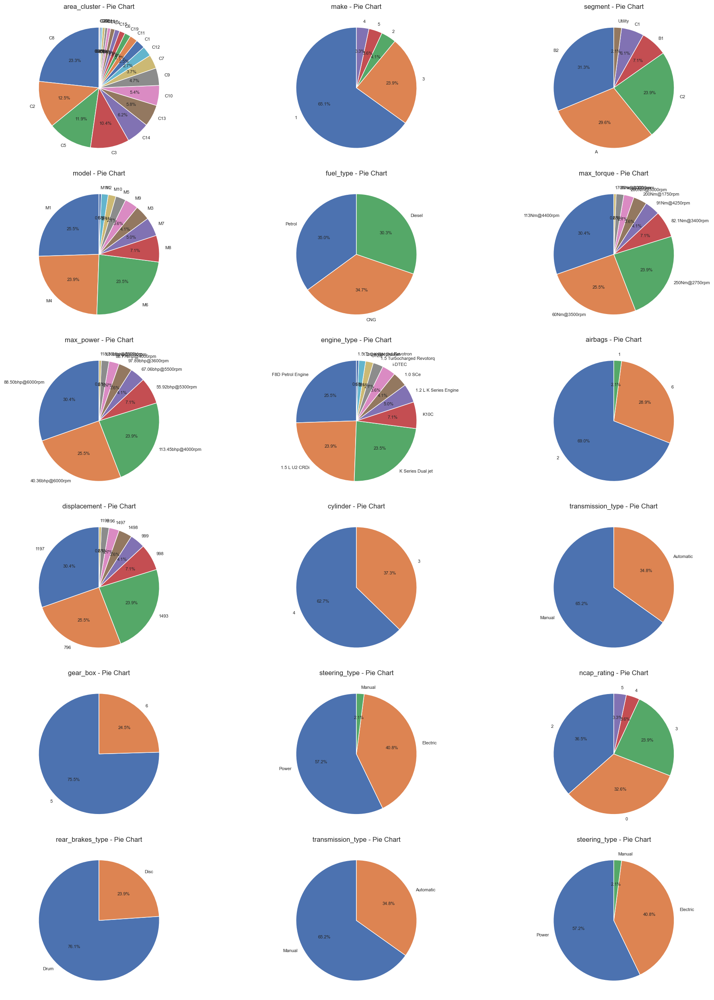

In [20]:
#训练集
categorical_columns = ["area_cluster", "make", "segment", "model", "fuel_type", 
    "max_torque", "max_power", "engine_type", "airbags", 
    "displacement", "cylinder", "transmission_type", "gear_box", 
    "steering_type", "ncap_rating","rear_brakes_type","transmission_type","steering_type"]

sns.set(style="whitegrid")
plt.figure(figsize=(20, 25))

for i, column in enumerate(categorical_columns):
    plt.subplot((len(categorical_columns) + 2) // 3, 3, i + 1)
    category_counts = data_train[column].value_counts()
    category_counts.plot.pie(autopct='%1.1f%%', startangle=90, textprops={'fontsize': 8})
    plt.title(f'{column} - Pie Chart')
    plt.ylabel('')

plt.tight_layout()
plt.show()

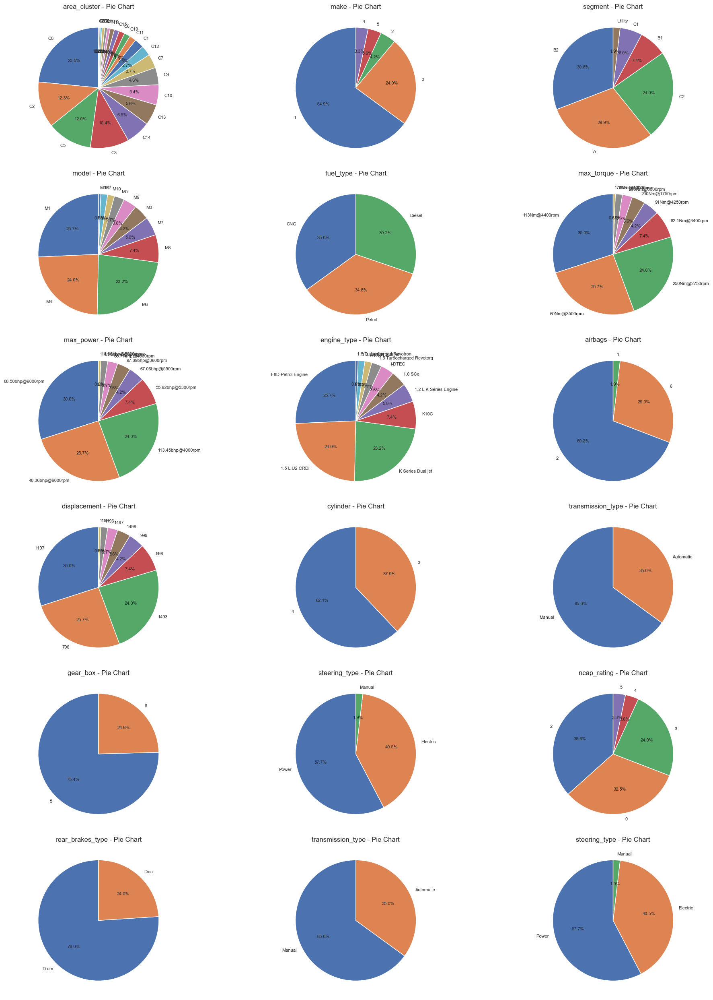

In [23]:
#测试集
sns.set(style="whitegrid")
plt.figure(figsize=(20, 25))

for i, column in enumerate(categorical_columns):
    plt.subplot((len(categorical_columns) + 2) // 3, 3, i + 1)
    category_counts = data_test[column].value_counts()
    category_counts.plot.pie(autopct='%1.1f%%', startangle=90, textprops={'fontsize': 8})
    plt.title(f'{column} - Pie Chart')
    plt.ylabel('')

plt.tight_layout()
plt.show()

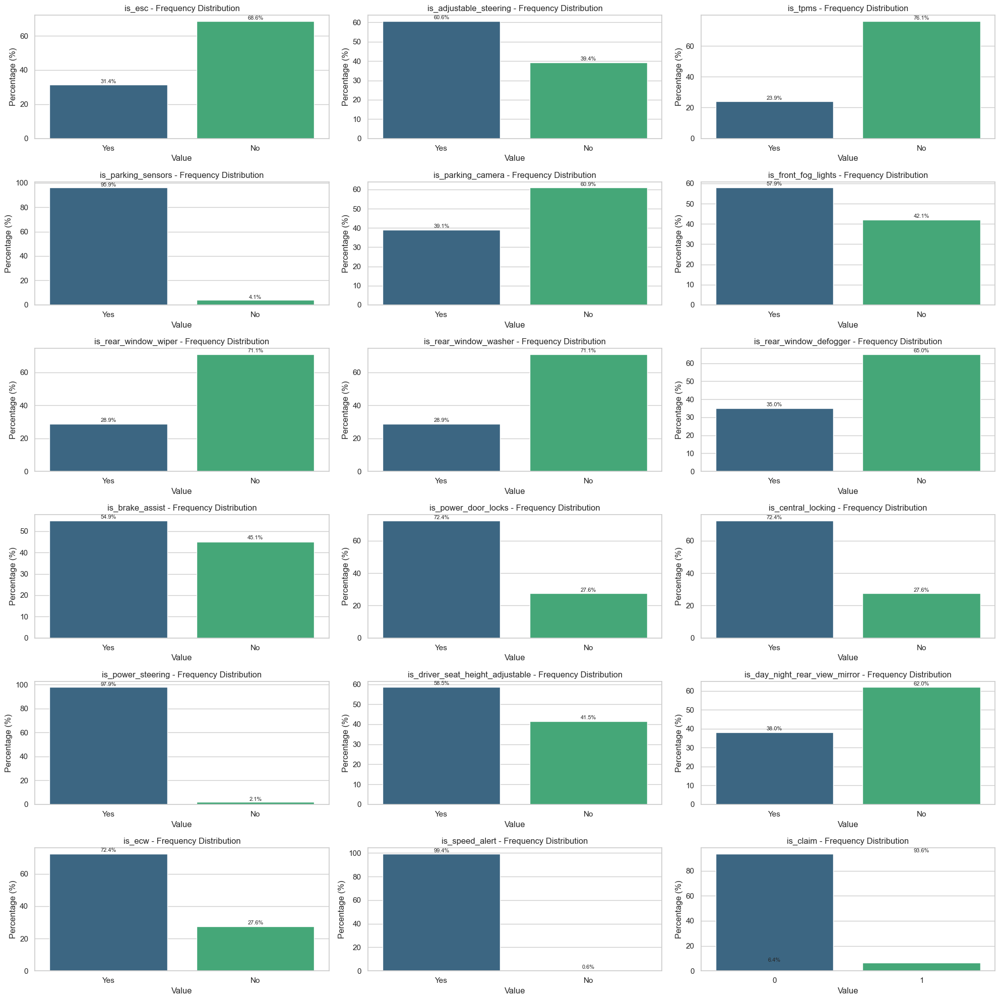

In [25]:
#训练集
boolean_columns_train = ["is_esc", "is_adjustable_steering", "is_tpms", "is_parking_sensors", 
    "is_parking_camera", "is_front_fog_lights", "is_rear_window_wiper", 
    "is_rear_window_washer", "is_rear_window_defogger", "is_brake_assist", 
    "is_power_door_locks", "is_central_locking", "is_power_steering", 
    "is_driver_seat_height_adjustable", "is_day_night_rear_view_mirror", 
    "is_ecw", "is_speed_alert", "is_claim"]

sns.set(style="whitegrid")
plt.figure(figsize=(20, 20))

for i, column in enumerate(boolean_columns_train):
    plt.subplot((len(boolean_columns_train) + 2) // 3, 3, i + 1)
    counts = data_train[column].value_counts(normalize=True).sort_index(ascending=False) * 100  # 正类在前
    sns.barplot(x=counts.index, y=counts.values, palette="viridis")
    plt.title(f'{column} - Frequency Distribution')
    plt.xlabel('Value')
    plt.ylabel('Percentage (%)')
    for index, value in enumerate(counts.values):
        plt.text(index, value + 1, f'{value:.1f}%', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

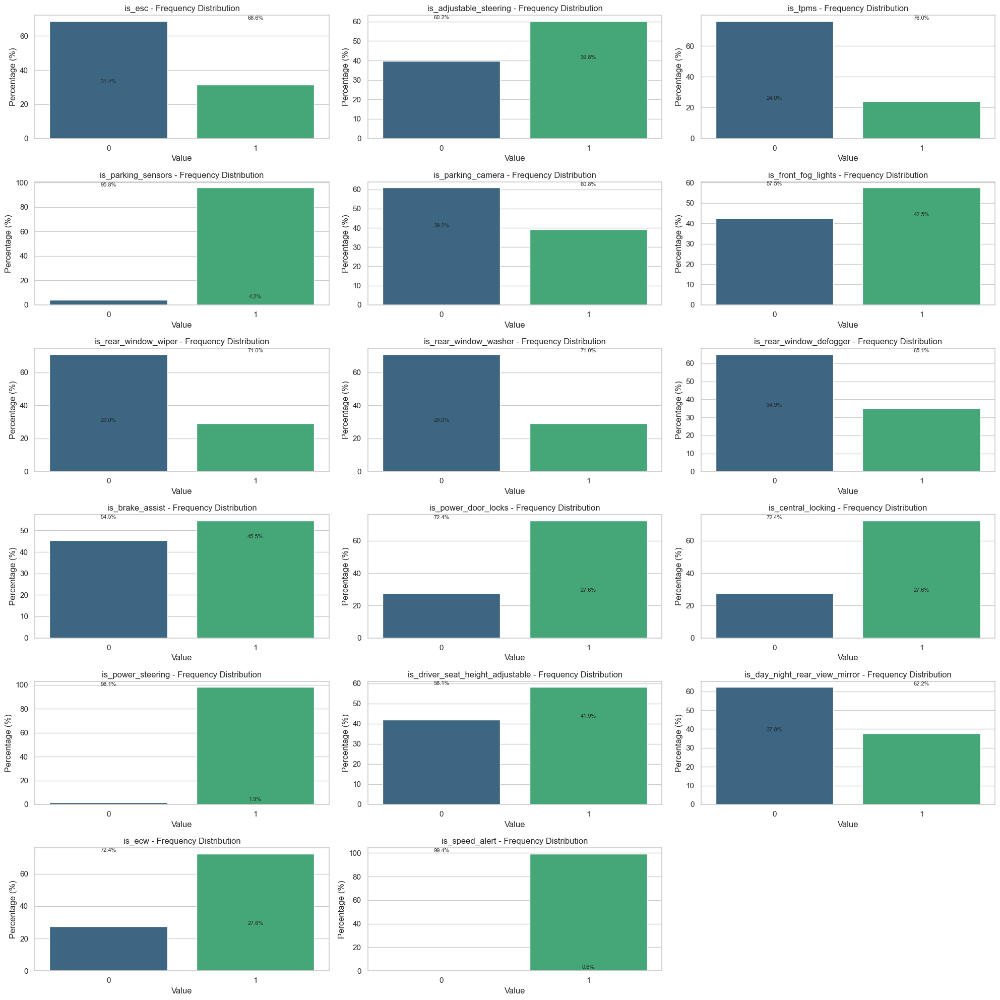

In [27]:
#测试集
boolean_columns_test = ["is_esc", "is_adjustable_steering", "is_tpms", "is_parking_sensors", 
    "is_parking_camera", "is_front_fog_lights", "is_rear_window_wiper", 
    "is_rear_window_washer", "is_rear_window_defogger", "is_brake_assist", 
    "is_power_door_locks", "is_central_locking", "is_power_steering", 
    "is_driver_seat_height_adjustable", "is_day_night_rear_view_mirror", 
    "is_ecw", "is_speed_alert"]

sns.set(style="whitegrid")
plt.figure(figsize=(20, 20))

for i, column in enumerate(boolean_columns_test):
    plt.subplot((len(boolean_columns_test) + 2) // 3, 3, i + 1)
    counts = data_test[column].value_counts(normalize=True).sort_index(ascending=False) * 100  # 正类在前
    sns.barplot(x=counts.index, y=counts.values, palette="viridis")
    plt.title(f'{column} - Frequency Distribution')
    plt.xlabel('Value')
    plt.ylabel('Percentage (%)')
    for index, value in enumerate(counts.values):
        plt.text(index, value + 1, f'{value:.1f}%', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

特征变量与输出值的关系

In [30]:
from scipy.stats import pointbiserialr

target_column = "is_claim"
# 计算点双列相关系数
correlation_results = {}
for column in numerical_columns:
    corr, p_value = pointbiserialr(data_train[column], data_train[target_column])
    correlation_results[column] = {"Correlation": corr, "P-Value": f"{p_value:.10f}"}

correlation_df = pd.DataFrame(correlation_results).T
correlation_df = correlation_df.sort_values(by="Correlation", ascending=False)
correlation_df

,Correlation,P-Value
policy_tenure,0.078747,0.0000000000
age_of_policyholder,0.022435,0.0000000560
width,0.009947,0.0160502848
length,0.006495,0.1159419937
gross_weight,0.003894,0.3458577871
turning_radius,0.002724,0.5096346505
height,-0.002024,0.6242737535
population_density,-0.017808,0.0000162593
age_of_car,-0.028172,0.0000000000


In [32]:
from scipy.stats import chi2_contingency

chi2_results = {}
for column in categorical_columns:
    contingency_table = pd.crosstab(data_train[column], data_train["is_claim"])
    chi2, p_value, _, _ = chi2_contingency(contingency_table)
    chi2_results[column] = {"Chi-Square": chi2, "P-Value": f"{p_value:.10f}"}

chi2_df = pd.DataFrame(chi2_results).T
chi2_df = chi2_df.sort_values(by="Chi-Square", ascending=False)
chi2_df

,Chi-Square,P-Value
area_cluster,96.082641,0.0000000000
model,19.97498,0.0294902222
engine_type,19.97498,0.0294902222
max_torque,19.388301,0.0129154221
max_power,19.388301,0.0129154221
displacement,19.388301,0.0129154221
segment,12.603887,0.0273874767
cylinder,10.460381,0.0012196212
fuel_type,5.759623,0.0561453437
steering_type,5.736127,0.0568088296


In [34]:
# 将布尔变量转换为数值类型（如 'Yes' -> 1, 'No' -> 0）
from sklearn.feature_selection import mutual_info_classif
for column in boolean_columns_train:
    if data_train[column].dtype == 'object':
        data_train[column] = data_train[column].map({'Yes': 1, 'No': 0}).fillna(0)

# 目标变量
target_column = "is_claim"


# 计算互信息
mi_scores = mutual_info_classif(data_train[boolean_columns_train], data_train[target_column], discrete_features=True)

# 将结果整理成数据框，并以小数形式展示
mi_df = pd.DataFrame({
    'Feature': boolean_columns_train, 
    'Mutual Information': [f"{score:.10f}" for score in mi_scores]
})
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)
mi_df

,Feature,Mutual Information
17,is_claim,0.2377482218
1,is_adjustable_steering,0.0000975852
5,is_front_fog_lights,0.0000702529
9,is_brake_assist,0.0000594970
13,is_driver_seat_height_adjustable,0.0000573615
3,is_parking_sensors,0.0000372395
14,is_day_night_rear_view_mirror,0.0000317698
16,is_speed_alert,0.0000302768
10,is_power_door_locks,0.0000222066
11,is_central_locking,0.0000222066


In [36]:
data_train.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
3,ID00004,0.900277,0.11,0.432692,C4,21622,1,C1,M2,Petrol,...,1,1,1,1,1,1,1,1,2,0
4,ID00005,0.596403,0.11,0.634615,C5,34738,2,A,M3,Petrol,...,0,1,1,1,0,1,1,1,2,0


In [38]:
# 训练集policy_tenure归一化
from sklearn.preprocessing import MinMaxScaler
scaler_train = MinMaxScaler()
data_train['policy_tenure'] = scaler_train.fit_transform(data_train[['policy_tenure']]) # 对 'policy_tenure' 列进行归一化，并直接覆盖原始数据
data_train

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
0,ID00001,0.368130,0.05,0.644231,C1,4990,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
1,ID00002,0.480580,0.02,0.375000,C2,27003,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
2,ID00003,0.601457,0.02,0.384615,C3,4076,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
3,ID00004,0.643904,0.11,0.432692,C4,21622,1,C1,M2,Petrol,...,1,1,1,1,1,1,1,1,2,0
4,ID00005,0.425902,0.11,0.634615,C5,34738,2,A,M3,Petrol,...,0,1,1,1,0,1,1,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58587,ID58588,0.252782,0.13,0.644231,C8,8794,2,A,M3,Petrol,...,0,1,1,1,0,1,1,1,2,0
58588,ID58589,0.858671,0.02,0.519231,C14,7788,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
58589,ID58590,0.831862,0.05,0.451923,C5,34738,1,A,M1,CNG,...,0,0,0,1,0,0,0,1,0,0
58590,ID58591,0.884975,0.14,0.557692,C8,8794,1,B2,M6,Petrol,...,1,1,1,1,1,1,1,1,2,0


In [40]:
# 测试集policy_tenure归一化
scaler_test = MinMaxScaler()
data_test['policy_tenure'] = scaler_test.fit_transform(data_test[['policy_tenure']]) # 对 'policy_tenure' 列进行归一化，并直接覆盖原始数据
data_test

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating
0,ID58593,0.244112,0.00,0.586538,C3,4076,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0
1,ID58594,0.219275,0.13,0.442308,C8,8794,1,B2,M6,Petrol,...,0,1,1,1,1,1,1,1,1,2
2,ID58595,0.234168,0.12,0.451923,C8,8794,2,A,M3,Petrol,...,0,0,1,1,1,0,1,1,1,2
3,ID58596,0.561630,0.01,0.461538,C5,34738,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0
4,ID58597,0.886225,0.02,0.634615,C5,34738,1,A,M1,CNG,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39058,ID97651,0.032576,0.15,0.740385,C2,27003,1,B2,M6,Petrol,...,0,1,1,1,1,1,1,1,1,2
39059,ID97652,0.880057,0.05,0.509615,C8,8794,3,C2,M4,Diesel,...,1,1,1,1,1,1,0,1,1,3
39060,ID97653,0.372694,0.12,0.355769,C6,13051,1,B2,M7,Petrol,...,1,1,1,1,1,1,1,1,1,0
39061,ID97654,0.842288,0.08,0.644231,C5,34738,1,C1,M2,Petrol,...,1,1,1,1,1,1,1,1,1,2


In [42]:
data_train1 = data_train.copy()

# 清洗每个数值型变量中的异常值
for column in numerical_columns:
    # 计算第一四分位数和第三四分位数
    Q1 = data_train1[column].quantile(0.25)
    Q3 = data_train1[column].quantile(0.75)
    IQR = Q3 - Q1  # 四分位距
    # 定义上下限
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # 删除超出上下限的异常值
    data_train1 = data_train1[(data_train1[column] >= lower_bound) & (data_train1[column] <= upper_bound)]
data_train1.drop(['policy_id','is_parking_sensors','is_power_steering','is_speed_alert'], axis=1,inplace=True)
data_train1

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating,is_claim
0,0.368130,0.05,0.644231,C1,4990,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
1,0.480580,0.02,0.375000,C2,27003,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
2,0.601457,0.02,0.384615,C3,4076,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
3,0.643904,0.11,0.432692,C4,21622,1,C1,M2,Petrol,113Nm@4400rpm,...,0,1,1,1,1,1,1,1,2,0
4,0.425902,0.11,0.634615,C5,34738,2,A,M3,Petrol,91Nm@4250rpm,...,0,0,0,1,1,0,1,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58587,0.252782,0.13,0.644231,C8,8794,2,A,M3,Petrol,91Nm@4250rpm,...,0,0,0,1,1,0,1,1,2,0
58588,0.858671,0.02,0.519231,C14,7788,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
58589,0.831862,0.05,0.451923,C5,34738,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
58590,0.884975,0.14,0.557692,C8,8794,1,B2,M6,Petrol,113Nm@4400rpm,...,0,0,1,1,1,1,1,1,2,0


In [44]:
data_test1 = data_test.copy()

# 清洗每个数值型变量中的异常值
for column in numerical_columns:
    # 计算第一四分位数和第三四分位数
    Q1 = data_test1[column].quantile(0.25)
    Q3 = data_test1[column].quantile(0.75)
    IQR = Q3 - Q1  # 四分位距
    # 定义上下限
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # 删除超出上下限的异常值
    data_test1 = data_test1[(data_test1[column] >= lower_bound) & (data_test1[column] <= upper_bound)]
data_test1.drop(['policy_id','is_parking_sensors','is_power_steering','is_speed_alert'], axis=1,inplace=True)
data_test1

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating
0,0.244112,0.00,0.586538,C3,4076,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
1,0.219275,0.13,0.442308,C8,8794,1,B2,M6,Petrol,113Nm@4400rpm,...,0,0,0,1,1,1,1,1,1,2
2,0.234168,0.12,0.451923,C8,8794,2,A,M3,Petrol,91Nm@4250rpm,...,0,0,0,0,1,1,0,1,1,2
3,0.561630,0.01,0.461538,C5,34738,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
4,0.886225,0.02,0.634615,C5,34738,1,A,M1,CNG,60Nm@3500rpm,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39058,0.032576,0.15,0.740385,C2,27003,1,B2,M6,Petrol,113Nm@4400rpm,...,0,0,0,1,1,1,1,1,1,2
39059,0.880057,0.05,0.509615,C8,8794,3,C2,M4,Diesel,250Nm@2750rpm,...,1,1,1,1,1,1,1,0,1,3
39060,0.372694,0.12,0.355769,C6,13051,1,B2,M7,Petrol,113Nm@4400rpm,...,1,1,1,1,1,1,1,1,1,0
39061,0.842288,0.08,0.644231,C5,34738,1,C1,M2,Petrol,113Nm@4400rpm,...,0,0,1,1,1,1,1,1,1,2


In [46]:
data_train_encoded = data_train1.copy()
data_test_encoded = data_test1.copy()

# 定义平滑系数
alpha = 1

# 对每个分类变量进行频率编码
for column in categorical_columns:
    # 计算每个类别的频率及总样本数
    freq_count = data_train_encoded[column].value_counts()
    total_count = len(data_train_encoded)
    category_count = len(freq_count)
    
    # 平滑频率计算
    smoothed_freq = (freq_count + alpha) / (total_count + category_count * alpha)
    freq_map = smoothed_freq.to_dict()
    
    # 训练集中用频率替换
    data_train_encoded[column] = data_train_encoded[column].map(freq_map)
    
    # 测试集中用训练集频率映射，未出现的类别填充为默认值（平滑处理的全局频率）
    global_mean = alpha / (total_count + category_count * alpha)  # 默认值
    data_test_encoded[column] = data_test_encoded[column].map(freq_map).fillna(global_mean)

# 查看频率编码后的数据
print("训练集前5行：")
data_train_encoded[categorical_columns].head()

训练集前5行：


,area_cluster,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,displacement,cylinder,transmission_type,gear_box,steering_type,ncap_rating,rear_brakes_type,transmission_type,steering_type
0,0.026789,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828
1,0.134018,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828
2,0.111523,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828
3,0.012128,0.646178,0.061245,0.018590,0.353578,0.306447,0.306447,0.018590,0.685333,0.306447,0.634063,0.353309,0.750982,0.411248,0.368927,0.757094,0.353309,0.411248
4,0.127523,0.041002,0.287487,0.040998,0.353578,0.040999,0.040999,0.040998,0.685333,0.040999,0.365937,0.353309,0.750982,0.411248,0.368927,0.757094,0.353309,0.411248


In [48]:
print("\n测试集前5行：")
data_test_encoded[categorical_columns].head()


测试集前5行：


,area_cluster,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,displacement,cylinder,transmission_type,gear_box,steering_type,ncap_rating,rear_brakes_type,transmission_type,steering_type
0,0.111523,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828
1,0.246569,0.646178,0.315127,0.237030,0.353578,0.306447,0.306447,0.237030,0.685333,0.306447,0.634063,0.646691,0.750982,0.411248,0.368927,0.757094,0.646691,0.411248
2,0.246569,0.041002,0.287487,0.040998,0.353578,0.040999,0.040999,0.040998,0.685333,0.040999,0.365937,0.353309,0.750982,0.411248,0.368927,0.757094,0.353309,0.411248
3,0.127523,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828
4,0.127523,0.646178,0.287487,0.246481,0.339739,0.246490,0.246490,0.246481,0.685333,0.246490,0.365937,0.646691,0.750982,0.567828,0.318253,0.757094,0.646691,0.567828


In [50]:
data_train_encoded

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating,is_claim
0,0.368130,0.05,0.644231,0.026789,4990,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
1,0.480580,0.02,0.375000,0.134018,27003,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
2,0.601457,0.02,0.384615,0.111523,4076,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
3,0.643904,0.11,0.432692,0.012128,21622,0.646178,0.061245,0.018590,0.353578,0.306447,...,0,1,1,1,1,1,1,1,0.368927,0
4,0.425902,0.11,0.634615,0.127523,34738,0.041002,0.287487,0.040998,0.353578,0.040999,...,0,0,0,1,1,0,1,1,0.368927,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58587,0.252782,0.13,0.644231,0.246569,8794,0.041002,0.287487,0.040998,0.353578,0.040999,...,0,0,0,1,1,0,1,1,0.368927,0
58588,0.858671,0.02,0.519231,0.066606,7788,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
58589,0.831862,0.05,0.451923,0.127523,34738,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
58590,0.884975,0.14,0.557692,0.246569,8794,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,1,1,1,1,1,1,0.368927,0


In [52]:
data_test_encoded

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating
0,0.244112,0.00,0.586538,0.111523,4076,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
1,0.219275,0.13,0.442308,0.246569,8794,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,0,1,1,1,1,1,1,0.368927
2,0.234168,0.12,0.451923,0.246569,8794,0.041002,0.287487,0.040998,0.353578,0.040999,...,0,0,0,0,1,1,0,1,1,0.368927
3,0.561630,0.01,0.461538,0.127523,34738,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
4,0.886225,0.02,0.634615,0.127523,34738,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39058,0.032576,0.15,0.740385,0.134018,27003,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,0,1,1,1,1,1,1,0.368927
39059,0.880057,0.05,0.509615,0.246569,8794,0.242893,0.242888,0.242866,0.306683,0.242875,...,1,1,1,1,1,1,1,0,1,0.242893
39060,0.372694,0.12,0.355769,0.016183,13051,0.646178,0.315127,0.050852,0.353578,0.306447,...,1,1,1,1,1,1,1,1,1,0.318253
39061,0.842288,0.08,0.644231,0.127523,34738,0.646178,0.061245,0.018590,0.353578,0.306447,...,0,0,1,1,1,1,1,1,1,0.368927


训练集相关性分析

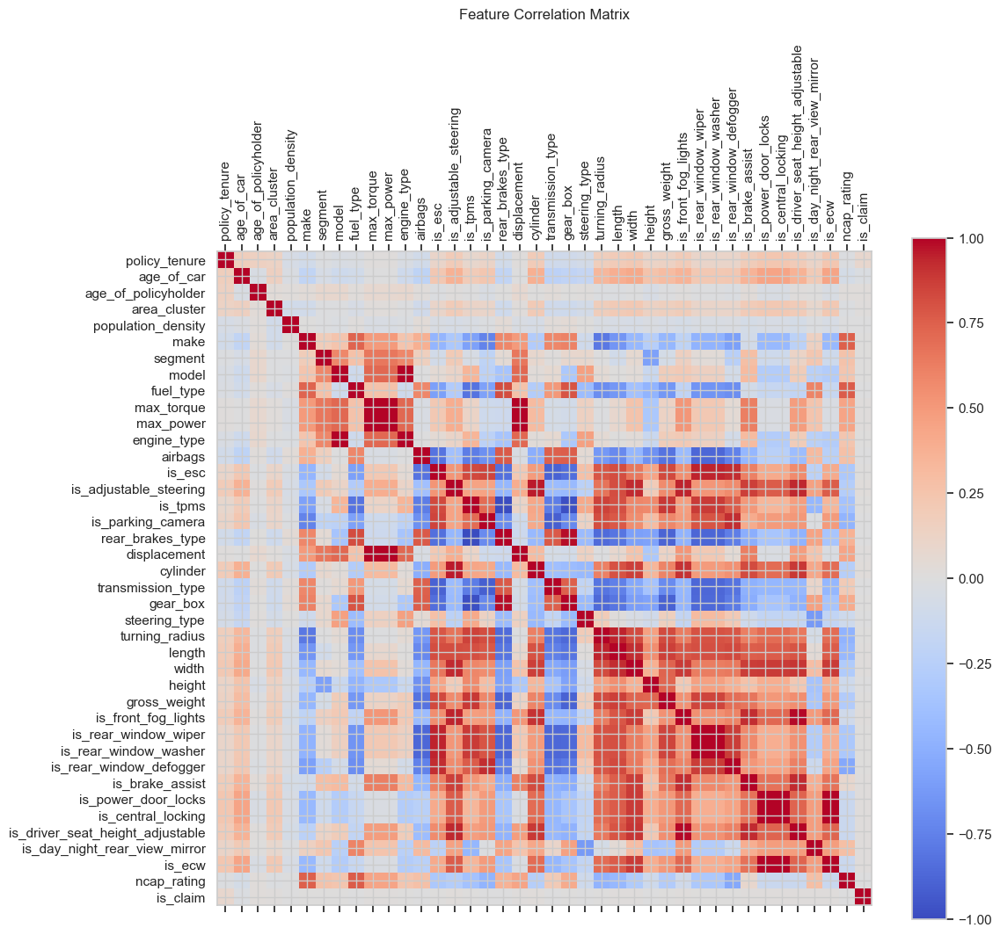

In [55]:
import pandas as pd
import matplotlib.pyplot as plt

# 计算相关性矩阵
correlation_matrix = data_train_encoded.corr()

# 绘制相关性热力图
plt.figure(figsize=(12, 10))
plt.matshow(correlation_matrix, fignum=1, cmap='coolwarm')  # 选择颜色映射
plt.colorbar()
plt.title('Feature Correlation Matrix', pad=20)
plt.xticks(range(correlation_matrix.shape[1]), correlation_matrix.columns, rotation=90)
plt.yticks(range(correlation_matrix.shape[0]), correlation_matrix.index)
plt.show()

In [57]:
# 查看相关性矩阵（打印前几行）
print("相关性矩阵前5行：")
correlation_matrix

相关性矩阵前5行：


,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating,is_claim
policy_tenure,1.000000,0.165565,0.141814,0.130759,-0.055589,-0.088270,-0.018980,-0.043829,-0.034616,0.012964,...,0.104071,0.107534,0.185623,0.231656,0.231656,0.192847,0.116824,0.231656,-0.017987,0.078287
age_of_car,0.165565,1.000000,-0.046396,0.155593,-0.036312,-0.193967,-0.060453,-0.113735,-0.089308,-0.004983,...,0.213326,0.223704,0.352170,0.439768,0.439768,0.360717,0.196366,0.439768,-0.066508,-0.026410
age_of_policyholder,0.141814,-0.046396,1.000000,0.036580,0.018083,0.034850,0.084014,0.081941,0.020784,0.075079,...,-0.011365,-0.030441,0.023497,-0.039237,-0.039237,0.009521,0.003219,-0.039237,0.021551,0.020430
area_cluster,0.130759,0.155593,0.036580,1.000000,-0.089391,-0.092234,-0.013642,-0.015450,-0.051132,0.017926,...,0.106896,0.101882,0.189170,0.216030,0.216030,0.189157,0.090789,0.216030,-0.020936,0.013691
population_density,-0.055589,-0.036312,0.018083,-0.089391,1.000000,0.002304,-0.014610,-0.029158,0.014062,-0.040801,...,-0.043647,-0.033041,-0.068113,-0.047204,-0.047204,-0.063890,-0.017783,-0.047204,-0.006906,-0.004611
make,-0.088270,-0.193967,0.034850,-0.092234,0.002304,1.000000,0.185189,0.248374,0.730036,0.499497,...,-0.469568,-0.590903,-0.085308,-0.433306,-0.433306,-0.229393,0.146696,-0.433306,0.748442,0.003069
segment,-0.018980,-0.060453,0.084014,-0.013642,-0.014610,0.185189,1.000000,0.578312,0.268410,0.655838,...,0.037811,-0.247003,0.285964,-0.114931,-0.114931,0.124692,0.234093,-0.114931,0.260315,0.005462
model,-0.043829,-0.113735,0.081941,-0.015450,-0.029158,0.248374,0.578312,1.000000,-0.110379,0.713259,...,0.155336,-0.084142,0.308025,-0.276867,-0.276867,0.183769,-0.236919,-0.276867,0.237568,0.002830
fuel_type,-0.034616,-0.089308,0.020784,-0.051132,0.014062,0.730036,0.268410,-0.110379,1.000000,0.261054,...,-0.655600,-0.682863,-0.082060,-0.163555,-0.163555,-0.189721,0.595868,-0.163555,0.762435,-0.000422
max_torque,0.012964,-0.004983,0.075079,0.017926,-0.040801,0.499497,0.655838,0.713259,0.261054,1.000000,...,0.211068,0.054101,0.621360,-0.036763,-0.036763,0.480528,0.246230,-0.036763,0.441629,0.010919


In [59]:
# 提取高相关性特征对
high_corr_pairs = correlation_matrix.unstack().sort_values(ascending=False)
high_corr_pairs = high_corr_pairs[high_corr_pairs < 1]  # 排除与自身的相关性
print("高相关性特征对：")
print(high_corr_pairs[high_corr_pairs > 0.8])  # 示例：相关性大于0.8

高相关性特征对：
is_driver_seat_height_adjustable  is_front_fog_lights                 0.987455
is_front_fog_lights               is_driver_seat_height_adjustable    0.987455
rear_brakes_type                  gear_box                            0.983656
gear_box                          rear_brakes_type                    0.983656
cylinder                          is_adjustable_steering              0.956433
                                                                        ...   
length                            cylinder                            0.802004
is_rear_window_washer             turning_radius                      0.801759
turning_radius                    is_rear_window_wiper                0.801759
                                  is_rear_window_washer               0.801759
is_rear_window_wiper              turning_radius                      0.801759
Length: 100, dtype: float64


测试集相关性分析

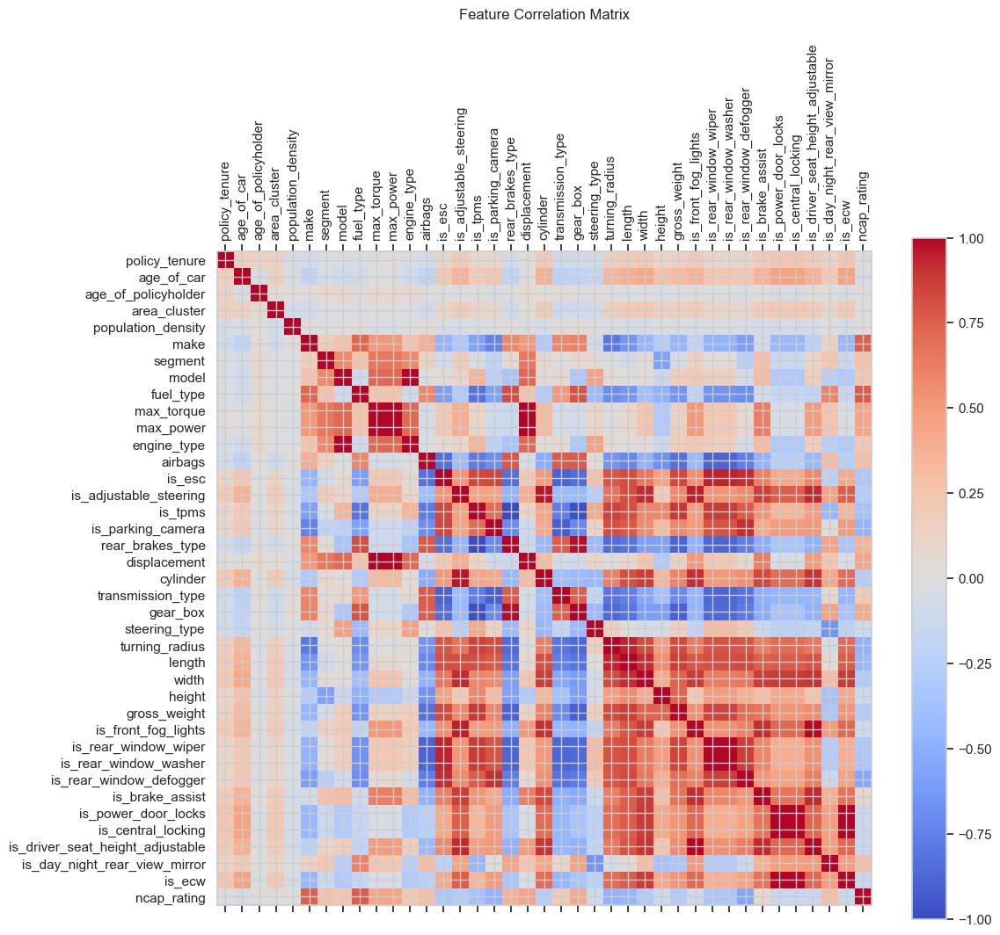

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# 计算相关性矩阵
correlation_matrix1 = data_test_encoded.corr()

# 绘制相关性热力图
plt.figure(figsize=(12, 10))
plt.matshow(correlation_matrix1, fignum=1, cmap='coolwarm')  # 选择颜色映射
plt.colorbar()
plt.title('Feature Correlation Matrix', pad=20)
plt.xticks(range(correlation_matrix1.shape[1]), correlation_matrix1.columns, rotation=90)
plt.yticks(range(correlation_matrix1.shape[0]), correlation_matrix1.index)
plt.show()

In [64]:
# 提取高相关性特征对
high_corr_pairs = correlation_matrix1.unstack().sort_values(ascending=False)
high_corr_pairs = high_corr_pairs[high_corr_pairs < 1]  # 排除与自身的相关性
print("高相关性特征对：")
print(high_corr_pairs[high_corr_pairs > 0.8])  # 示例：相关性大于0.8

高相关性特征对：
is_driver_seat_height_adjustable  is_front_fog_lights                 0.987347
is_front_fog_lights               is_driver_seat_height_adjustable    0.987347
rear_brakes_type                  gear_box                            0.983467
gear_box                          rear_brakes_type                    0.983467
cylinder                          is_adjustable_steering              0.961642
                                                                        ...   
                                  length                              0.805482
is_rear_window_wiper              turning_radius                      0.802251
turning_radius                    is_rear_window_wiper                0.802251
is_rear_window_washer             turning_radius                      0.802251
turning_radius                    is_rear_window_washer               0.802251
Length: 100, dtype: float64


In [66]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# 提取特征和目标变量
X = data_train_encoded.drop('is_claim', axis=1)  # 特征
y = data_train_encoded['is_claim']             # 目标变量

print("原始类别分布：", Counter(y)) # 查看原始类别分布

smote = SMOTE(random_state=42) # 初始化 SMOTE
X_resampled, y_resampled = smote.fit_resample(X, y) # 生成新的平衡数据集
print("SMOTE后类别分布：", Counter(y_resampled)) # 查看采样后的类别分布
# 将新的数据集合并
data_train_balanced = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name='is_claim')], axis=1)

print("采样后的数据集大小：", data_train_balanced.shape) # 检查新的数据集

原始类别分布： Counter({0: 50935, 1: 3545})
SMOTE后类别分布： Counter({0: 50935, 1: 50935})
采样后的数据集大小： (101870, 40)


In [68]:
data_train_balanced

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating,is_claim
0,0.368130,0.050000,0.644231,0.026789,4990,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
1,0.480580,0.020000,0.375000,0.134018,27003,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
2,0.601457,0.020000,0.384615,0.111523,4076,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0.318253,0
3,0.643904,0.110000,0.432692,0.012128,21622,0.646178,0.061245,0.018590,0.353578,0.306447,...,0,1,1,1,1,1,1,1,0.368927,0
4,0.425902,0.110000,0.634615,0.127523,34738,0.041002,0.287487,0.040998,0.353578,0.040999,...,0,0,0,1,1,0,1,1,0.368927,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101865,0.698787,0.010000,0.462122,0.111523,4076,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,1,1,1,1,1,1,0.368927,1
101866,0.603066,0.045615,0.381068,0.134018,27003,0.646178,0.072331,0.072324,0.339739,0.072327,...,0,0,0,1,1,0,0,1,0.368927,1
101867,0.824671,0.050000,0.707495,0.246569,8794,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,1,1,1,1,1,1,0.368927,1
101868,0.747960,0.029627,0.615026,0.246569,8794,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,1,1,1,1,1,1,0.368927,1


 # 基于各模型的半监督学习

## 数据分割

In [78]:
import time
X = data_train_balanced.drop(columns=['is_claim'])  # 特征
y = data_train_balanced['is_claim']  # 标签

seed = int(time.time())  # 动态种子
print(f"当前随机种子: {seed}")

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=seed)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=seed)

print(f"训练集大小: {X_train.shape[0]} ({X_train.shape[0] / X.shape[0]:.1%})")
print(f"验证集大小: {X_val.shape[0]} ({X_val.shape[0] / X.shape[0]:.1%})")
print(f"测试集大小: {X_test.shape[0]} ({X_test.shape[0] / X.shape[0]:.1%})")

当前随机种子: 1737031923
训练集大小: 61122 (60.0%)
验证集大小: 20374 (20.0%)
测试集大小: 20374 (20.0%)


In [80]:
X_unlabeled = data_test_encoded.copy()
X_unlabeled = X_unlabeled[X_train.columns].copy()

print(f"伪标签数据集大小: {X_unlabeled.shape}")
print(f"伪标签数据集列名: {X_unlabeled.columns.tolist()}")

伪标签数据集大小: (36228, 39)
伪标签数据集列名: ['policy_tenure', 'age_of_car', 'age_of_policyholder', 'area_cluster', 'population_density', 'make', 'segment', 'model', 'fuel_type', 'max_torque', 'max_power', 'engine_type', 'airbags', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder', 'transmission_type', 'gear_box', 'steering_type', 'turning_radius', 'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'ncap_rating']


In [82]:
X_unlabeled

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,...,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,ncap_rating
0,0.244112,0.00,0.586538,0.111523,4076,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
1,0.219275,0.13,0.442308,0.246569,8794,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,0,1,1,1,1,1,1,0.368927
2,0.234168,0.12,0.451923,0.246569,8794,0.041002,0.287487,0.040998,0.353578,0.040999,...,0,0,0,0,1,1,0,1,1,0.368927
3,0.561630,0.01,0.461538,0.127523,34738,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
4,0.886225,0.02,0.634615,0.127523,34738,0.646178,0.287487,0.246481,0.339739,0.246490,...,0,0,0,0,0,0,0,0,0,0.318253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39058,0.032576,0.15,0.740385,0.134018,27003,0.646178,0.315127,0.237030,0.353578,0.306447,...,0,0,0,1,1,1,1,1,1,0.368927
39059,0.880057,0.05,0.509615,0.246569,8794,0.242893,0.242888,0.242866,0.306683,0.242875,...,1,1,1,1,1,1,1,0,1,0.242893
39060,0.372694,0.12,0.355769,0.016183,13051,0.646178,0.315127,0.050852,0.353578,0.306447,...,1,1,1,1,1,1,1,1,1,0.318253
39061,0.842288,0.08,0.644231,0.127523,34738,0.646178,0.061245,0.018590,0.353578,0.306447,...,0,0,1,1,1,1,1,1,1,0.368927


 ### 基于随机森林

In [76]:
#导入随机森林相关库
import pandas as pd
import numpy as np
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score, roc_curve, auc
from sklearn.model_selection import train_test_split

验证集调参

In [83]:
# 参数网格
param_grid = {
    'n_estimators': [50, 75, 100, 150, 200],  # 树的数量
    'max_depth': [5, 10, 15],            # 最大深度
    'min_samples_split': [2, 5, 10],     # 节点分裂所需最小样本数
    'min_samples_leaf': [1, 2, 4]        # 叶节点的最小样本数
}

# 初始化结果存储
results = []

# 记录开始时间
start_time = time.time()

# 手动网格搜索
for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for min_samples_split in param_grid['min_samples_split']:
            for min_samples_leaf in param_grid['min_samples_leaf']:
                # 强制将整数参数转换为整型
                n_estimators = int(n_estimators)
                max_depth = int(max_depth)
                min_samples_split = int(min_samples_split)
                min_samples_leaf = int(min_samples_leaf)
                # 初始化模型
                model = RandomForestClassifier(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    min_samples_split=min_samples_split,
                    min_samples_leaf=min_samples_leaf,
                    random_state=42
                )
                
                # 在训练集上训练模型
                model.fit(X_train, y_train)
                
                # 在验证集上评估性能
                val_probs = model.predict_proba(X_val)[:, 1]  # 提取正类概率
                val_auc = roc_auc_score(y_val, val_probs)  # 验证集 AUC
                
                # 存储结果
                results.append({
                    'n_estimators': n_estimators,
                    'max_depth': max_depth,
                    'min_samples_split': min_samples_split,
                    'min_samples_leaf': min_samples_leaf,
                    'val_auc': val_auc
                })

# 转为 DataFrame
results_df = pd.DataFrame(results)

# 找到最佳参数组合
best_result = results_df.loc[results_df['val_auc'].idxmax()]
best_params = best_result[['n_estimators', 'max_depth', 'min_samples_split', 'min_samples_leaf']].to_dict()
best_auc = best_result['val_auc']

# 强制将最佳参数转换为整型
best_params = {key: int(value) if isinstance(value, float) else value for key, value in best_params.items()}

# 记录结束时间
end_time = time.time()
elapsed_time = end_time - start_time

# 输出结果
print(f"最佳参数: {best_params}")
print(f"验证集 AUC（最佳参数模型）: {best_auc:.4f}")
print(f"超参数搜索总耗时: {elapsed_time:.2f} 秒")

最佳参数: {'n_estimators': 200, 'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 1}
验证集 AUC（最佳参数模型）: 0.8946
超参数搜索总耗时: 383.36 秒


In [85]:
# 输出调参过程的所有参数组合及其验证集 AUC
print("\n调参过程中的参数组合及其验证集 AUC：")
print(results_df.sort_values(by='val_auc', ascending=False).to_string(index=False))


调参过程中的参数组合及其验证集 AUC：
 n_estimators  max_depth  min_samples_split  min_samples_leaf  val_auc
          200         15                  2                 1 0.894582
          150         15                  2                 1 0.893688
          150         15                  5                 1 0.892808
          200         15                  5                 1 0.892697
          100         15                  5                 1 0.891121
          100         15                  2                 1 0.890694
          200         15                  5                 2 0.890389
          200         15                  2                 2 0.890326
          150         15                  2                 2 0.889743
           75         15                  2                 1 0.889564
           75         15                  5                 1 0.889533
          150         15                  5                 2 0.889513
           50         15                  5            

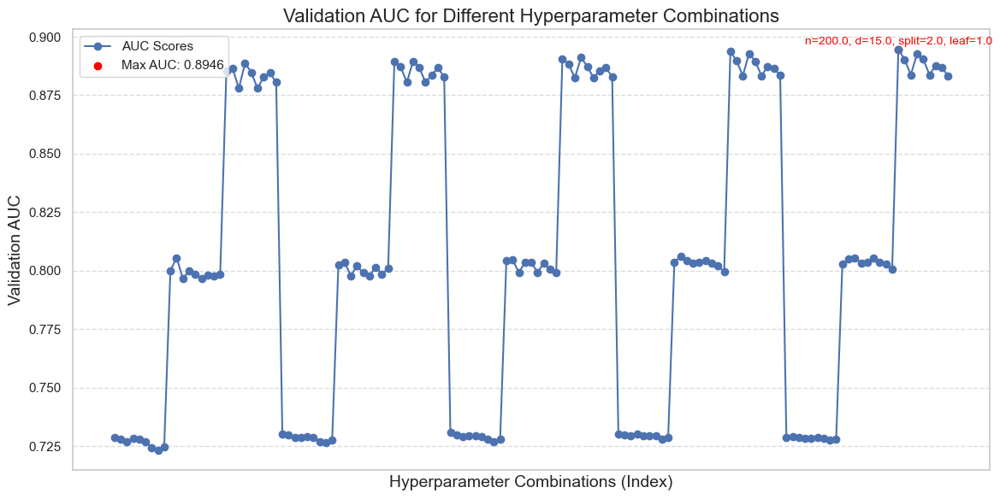

In [87]:
# 提取参数组合及其 AUC
x_labels = results_df.apply(lambda row: f"n={row['n_estimators']}, d={row['max_depth']}, "
                                        f"split={row['min_samples_split']}, leaf={row['min_samples_leaf']}", axis=1)
auc_scores = results_df['val_auc']

# 找到最佳 AUC 和对应参数组合
best_idx = auc_scores.idxmax()
best_auc = auc_scores[best_idx]
best_label = x_labels[best_idx]

# 绘制 AUC 连线图
plt.figure(figsize=(12, 6))
plt.plot(range(len(auc_scores)), auc_scores, marker='o', linestyle='-', label="AUC Scores")
plt.scatter(best_idx, best_auc, color='red', label=f"Max AUC: {best_auc:.4f}")
plt.text(best_idx, best_auc + 0.002, f"{best_label}", fontsize=10, color='red', ha='center')
plt.title("Validation AUC for Different Hyperparameter Combinations", fontsize=16)
plt.xlabel("Hyperparameter Combinations (Index)", fontsize=14)
plt.ylabel("Validation AUC", fontsize=14)
plt.xticks([])  # 隐藏横轴具体组合
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

In [89]:
# 使用最优参数初始化模型
model = RandomForestClassifier(
    **best_params,  # 使用刚才调参得到的最优参数
    random_state=42
)

# 半监督学习参数
confidence_threshold = 0.9  # 初始高置信度阈值
max_iterations = 10  # 最大迭代次数
early_stop_rounds = 2  # 连续未提升轮次数的终止条件
no_improve_count = 0  # 未提升轮次计数
performance_metrics = []  # 存储每轮的性能指标

best_model = None  # 保存最优模型
best_iteration = -1  # 保存最优轮次
best_auc = 0  # 保存最高 AUC

In [97]:
for iteration in range(1, max_iterations + 1):
    print(f"\n=== 第 {iteration} 轮迭代 ===")
    
    # 1. 训练模型
    model.fit(X_train, y_train)
    
    # 2. 测试集性能评估
    test_predictions = model.predict(X_test)
    test_probs = model.predict_proba(X_test)[:, 1]
    test_auc = roc_auc_score(y_test, test_probs)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_confusion = confusion_matrix(y_test, test_predictions)
    test_report = classification_report(y_test, test_predictions, output_dict=True)
    
    print(f"\n测试集性能：")
    print(f"准确率={test_accuracy:.4f}, AUC={test_auc:.4f}")
    print(f"混淆矩阵：\n{test_confusion}")
    print(classification_report(y_test, test_predictions))
    
    # 3. 在无标签数据上生成伪标签
    unlabeled_probs = model.predict_proba(X_unlabeled)
    unlabeled_predictions = model.predict(X_unlabeled)
    high_confidence_mask = (unlabeled_probs.max(axis=1) >= confidence_threshold)
    high_confidence_samples = X_unlabeled[high_confidence_mask]
    high_confidence_labels = unlabeled_predictions[high_confidence_mask]
    
    print(f"可信伪标签样本数量：{len(high_confidence_samples)}")
    
    # 如果没有高置信度样本，提前停止迭代
    if len(high_confidence_samples) == 0:
        print("无高置信度伪标签样本，提前停止迭代。")
        break
    
    # 4. 扩展训练集
    X_train = pd.concat([X_train, high_confidence_samples], axis=0)
    y_train = pd.concat([y_train, pd.Series(high_confidence_labels, index=high_confidence_samples.index)], axis=0)
    
    # 5. 存储当前轮次性能指标
    performance_metrics.append({
        'iteration': iteration,
        'test_accuracy': test_accuracy,
        'test_auc': test_auc,
        'precision': test_report['1']['precision'],  # 正类的精确率
        'recall': test_report['1']['recall'],        # 正类的召回率
        'f1_score': test_report['1']['f1-score'],   # 正类的 F1-score
        'high_confidence_samples': len(high_confidence_samples)
    })
    
    # 6. 检查性能提升
    if test_auc > best_auc:
        best_auc = test_auc
        best_model = model
        best_iteration = iteration
        no_improve_count = 0  # 重置未提升计数
    else:
        no_improve_count += 1  # 增加未提升计数
        print(f"模型性能未提升，连续未提升轮次：{no_improve_count}")
    
    # 7. 检查终止条件
    if no_improve_count >= early_stop_rounds:
        print("模型连续两轮未提升，提前终止迭代。")
        break

# 输出每轮性能指标
performance_df = pd.DataFrame(performance_metrics)
print("\n每轮性能指标：")
print(performance_df)

# 输出最优模型和轮次
print(f"\n最优模型出现在第 {best_iteration} 轮，AUC={best_auc:.4f}")


=== 第 1 轮迭代 ===

测试集性能：
准确率=0.7917, AUC=0.8903
混淆矩阵：
[[7301 2864]
 [1379 8830]]
              precision    recall  f1-score   support

           0       0.84      0.72      0.77     10165
           1       0.76      0.86      0.81     10209

    accuracy                           0.79     20374
   macro avg       0.80      0.79      0.79     20374
weighted avg       0.80      0.79      0.79     20374

可信伪标签样本数量：8418
模型性能未提升，连续未提升轮次：3
模型连续两轮未提升，提前终止迭代。

每轮性能指标：
    iteration  test_accuracy  test_auc  precision    recall  f1_score  \
0           1       0.795180  0.889820   0.750083  0.886669  0.812677   
1           2       0.793855  0.888848   0.747590  0.888628  0.812030   
2           3       0.794444  0.890933   0.747066  0.891664  0.812986   
3           4       0.792530  0.890430   0.746132  0.888138  0.810966   
4           5       0.794051  0.891033   0.748944  0.885983  0.811720   
5           6       0.793315  0.888887   0.749584  0.882261  0.810529   
6           7       0

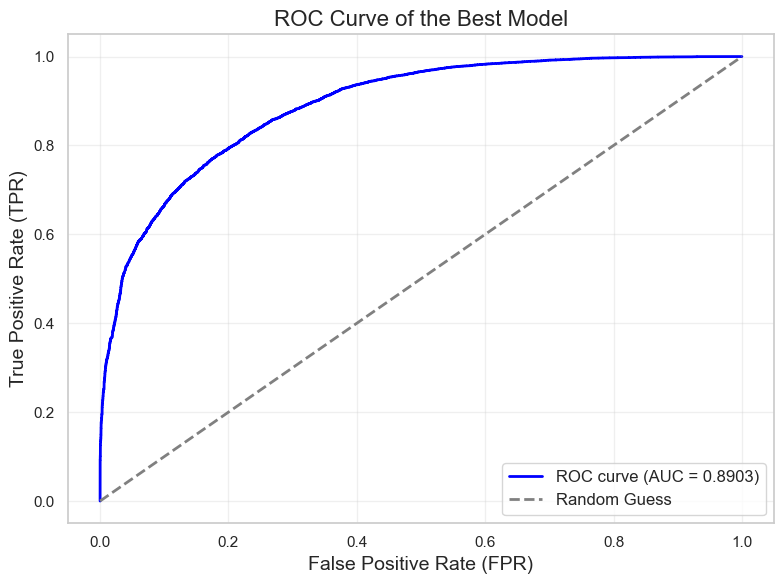

最优模型的 AUC: 0.8903


In [99]:
# 确保最优模型已被保存
if best_model is None:
    print("未找到最优模型，请确认是否执行了模型训练和参数搜索！")
else:
    # 使用最优模型预测测试集概率
    best_test_probs = best_model.predict_proba(X_test)[:, 1]  # 提取正类概率
    fpr, tpr, thresholds = roc_curve(y_test, best_test_probs)  # 计算 ROC 曲线和 AUC
    roc_auc = auc(fpr, tpr)

    # 绘制 ROC 曲线
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label='Random Guess')  # 对角线
    plt.title('ROC Curve of the Best Model', fontsize=16)
    plt.xlabel('False Positive Rate (FPR)', fontsize=14)
    plt.ylabel('True Positive Rate (TPR)', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"最优模型的 AUC: {roc_auc:.4f}")

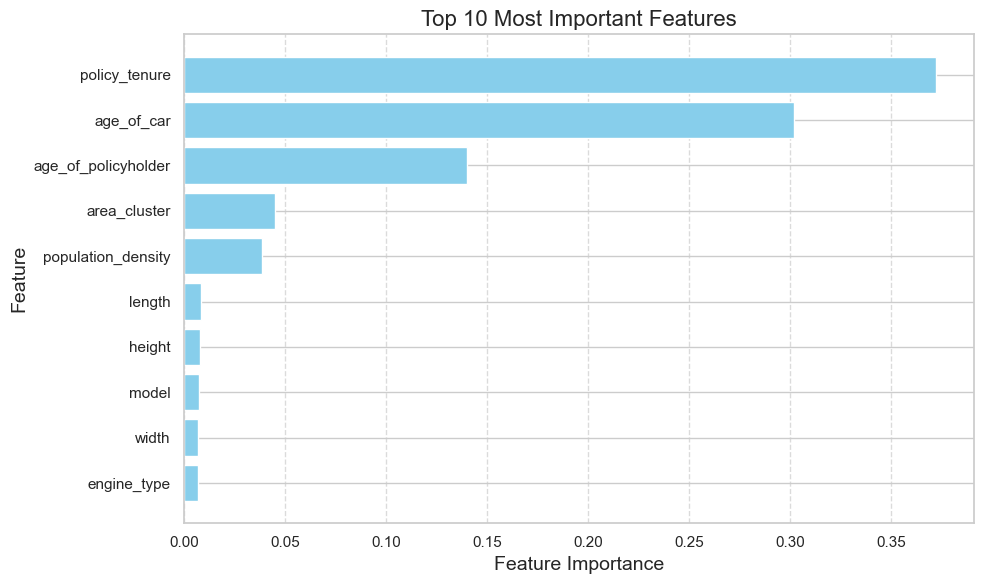

Top 10 Most Important Features:
                Feature  Importance
0         policy_tenure    0.372515
1            age_of_car    0.302099
2   age_of_policyholder    0.140383
3          area_cluster    0.045315
4    population_density    0.038452
24               length    0.008396
26               height    0.008219
7                 model    0.007640
25                width    0.006937
11          engine_type    0.006906


In [101]:
# 提取特征重要性
feature_importances = best_model.feature_importances_  # 提取最优模型的特征重要性
features = X_train.columns  # 获取特征名称

# 创建一个 DataFrame 存储特征及其重要性
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# 按重要性降序排序，并取前 10 个特征
top_10_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

# 可视化最重要的 10 个特征
plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # 反转 y 轴，使最重要的特征在顶部
plt.title('Top 10 Most Important Features', fontsize=16)
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 打印最重要的 10 个特征
print("Top 10 Most Important Features:")
print(top_10_features)

### 基于逻辑回归

In [108]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import roc_auc_score
import time
import pandas as pd

# 参数网格
param_grid = {
    'penalty': ['l1', 'l2'],                  # 正则化项
    'C': [0.01, 0.1, 1, 10, 100],            # 正则化强度的倒数
    'solver': ['liblinear', 'saga'],         # 求解器，适用于L1和L2正则化
    'max_iter': [100, 200, 500]              # 最大迭代次数
}

# 初始化结果存储
results = []

# 记录开始时间
start_time = time.time()

# 手动网格搜索
for params in ParameterGrid(param_grid):
    # 初始化模型
    model = LogisticRegression(
        penalty=params['penalty'],
        C=params['C'],
        solver=params['solver'],
        max_iter=params['max_iter'],
        random_state=42
    )
    
    # 训练模型
    model.fit(X_train, y_train)
    
    # 在验证集上评估性能
    val_probs = model.predict_proba(X_val)[:, 1]  # 提取正类概率
    val_auc = roc_auc_score(y_val, val_probs)
    
    # 存储结果
    results.append({
        'penalty': params['penalty'],
        'C': params['C'],
        'solver': params['solver'],
        'max_iter': params['max_iter'],
        'val_auc': val_auc
    })

# 转为 DataFrame
results_df = pd.DataFrame(results)

# 找到最佳参数组合
best_result = results_df.loc[results_df['val_auc'].idxmax()]
best_params = best_result[['penalty', 'C', 'solver', 'max_iter']].to_dict()
best_auc = best_result['val_auc']

# 记录结束时间
end_time = time.time()
elapsed_time = end_time - start_time

# 输出调参结果
print(f"最佳参数: {best_params}")
print(f"验证集 AUC（最佳参数模型）: {best_auc:.4f}")
print(f"超参数搜索总耗时: {elapsed_time:.2f} 秒")

/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max

最佳参数: {'penalty': 'l1', 'C': 100.0, 'solver': 'liblinear', 'max_iter': 100}
验证集 AUC（最佳参数模型）: 0.6114
超参数搜索总耗时: 1375.20 秒


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [110]:
# 输出调参过程的所有参数组合及其验证集 AUC
print("\n调参过程的所有参数组合及其验证集 AUC：")
print(results_df.sort_values(by='val_auc', ascending=False).to_string(index=False))


调参过程的所有参数组合及其验证集 AUC：
penalty      C    solver  max_iter  val_auc
     l1 100.00 liblinear       500 0.611402
     l1 100.00 liblinear       200 0.611402
     l1 100.00 liblinear       100 0.611402
     l1   1.00 liblinear       500 0.611375
     l1   1.00 liblinear       200 0.611375
     l1   1.00 liblinear       100 0.611375
     l1  10.00 liblinear       500 0.611312
     l1  10.00 liblinear       200 0.611312
     l1  10.00 liblinear       100 0.611312
     l1   0.10 liblinear       200 0.610128
     l1   0.10 liblinear       100 0.610128
     l1   0.10 liblinear       500 0.610128
     l1   0.01 liblinear       100 0.604126
     l1   0.01 liblinear       200 0.604126
     l1   0.01 liblinear       500 0.604126
     l2  10.00      saga       500 0.521978
     l2 100.00      saga       500 0.521978
     l2   1.00      saga       500 0.521978
     l1 100.00      saga       500 0.521978
     l2   0.10      saga       500 0.521978
     l1  10.00      saga       500 0.521978
     l2  

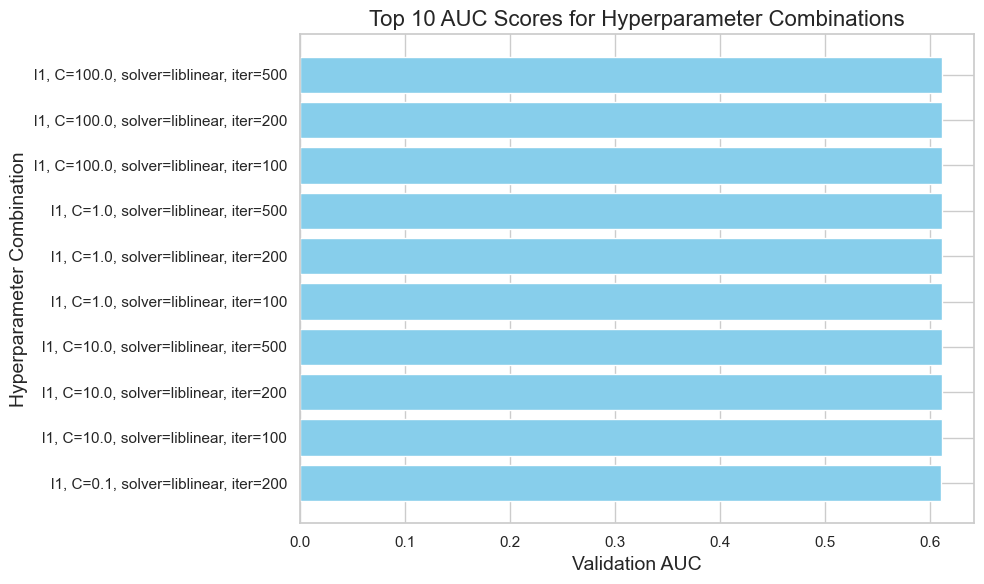

In [114]:
import matplotlib.pyplot as plt

# 选择前 10 个最佳参数组合
top_n = 10
top_results = results_df.sort_values(by='val_auc', ascending=False).head(top_n)

# 提取数据
x_labels = top_results.apply(lambda row: f"{row['penalty']}, C={row['C']}, solver={row['solver']}, iter={row['max_iter']}", axis=1)
auc_scores = top_results['val_auc']

# 绘制柱状图
plt.figure(figsize=(10, 6))
plt.barh(x_labels, auc_scores, color='skyblue')
plt.xlabel("Validation AUC", fontsize=14)
plt.ylabel("Hyperparameter Combination", fontsize=14)
plt.title(f"Top {top_n} AUC Scores for Hyperparameter Combinations", fontsize=16)
plt.gca().invert_yaxis()  # 反转Y轴，让最佳组合在顶部
plt.tight_layout()
plt.show()

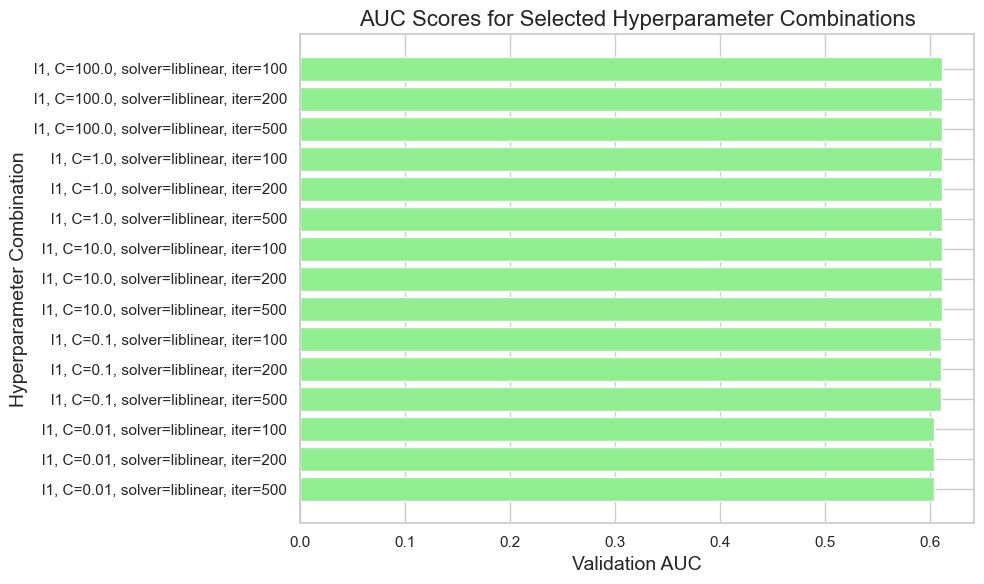

In [128]:
# 筛选验证集 AUC 大于 0.6 的参数组合
filtered_results = results_df[results_df['val_auc'] > 0.6].sort_values(by='val_auc', ascending=False)

# 提取数据
x_labels = filtered_results.apply(lambda row: f"{row['penalty']}, C={row['C']}, solver={row['solver']}, iter={row['max_iter']}", axis=1)
auc_scores = filtered_results['val_auc']

# 绘制柱状图
plt.figure(figsize=(10, 6))
plt.barh(x_labels, auc_scores, color='lightgreen')
plt.xlabel("Validation AUC", fontsize=14)
plt.ylabel("Hyperparameter Combination", fontsize=14)
plt.title("AUC Scores for Selected Hyperparameter Combinations", fontsize=16)
plt.gca().invert_yaxis()  # 反转Y轴
plt.tight_layout()
plt.show()

In [132]:
from sklearn.linear_model import LogisticRegression

# 使用最优参数初始化模型
model = LogisticRegression(
    penalty='l2',  # 使用调参得到的正则化方式
    C=1.0,         # 正则化强度
    solver='liblinear',  # 求解器
    max_iter=200,   # 最大迭代次数
    random_state=42
)

# 半监督学习参数
confidence_threshold = 0.9  # 初始高置信度阈值
max_iterations = 10  # 最大迭代次数
early_stop_rounds = 2  # 连续未提升轮次数的终止条件
no_improve_count = 0  # 未提升轮次计数
performance_metrics = []  # 存储每轮的性能指标

best_model = None  # 保存最优模型
best_iteration = -1  # 保存最优轮次
best_auc = 0  # 保存最高 AUC

In [138]:
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, classification_report
import pandas as pd

# 半监督学习过程
for iteration in range(1, max_iterations + 1):
    print(f"\n=== 第 {iteration} 轮迭代 ===")
    
    # 1. 训练模型
    model.fit(X_train, y_train)
    
    # 2. 测试集性能评估
    test_probs = model.predict_proba(X_test)[:, 1]  # 提取正类概率
    test_predictions = model.predict(X_test)  # 分类结果
    test_auc = roc_auc_score(y_test, test_probs)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_confusion = confusion_matrix(y_test, test_predictions)
    test_report = classification_report(y_test, test_predictions, output_dict=True)
    
    print(f"\n测试集性能：")
    print(f"准确率={test_accuracy:.4f}, AUC={test_auc:.4f}")
    print(f"混淆矩阵：\n{test_confusion}")
    print(classification_report(y_test, test_predictions))
    
    # 3. 在无标签数据上生成伪标签
    unlabeled_probs = model.predict_proba(X_unlabeled)
    unlabeled_predictions = model.predict(X_unlabeled)
    high_confidence_mask = (unlabeled_probs.max(axis=1) >= confidence_threshold)
    high_confidence_samples = X_unlabeled[high_confidence_mask]
    high_confidence_labels = unlabeled_predictions[high_confidence_mask]
    
    print(f"可信伪标签样本数量：{len(high_confidence_samples)}")
    
    # 如果没有高置信度样本，提前停止迭代
    #if len(high_confidence_samples) == 0:
       # print("无高置信度伪标签样本，提前停止迭代。")
       # break
    
    # 4. 扩展训练集
    X_train = pd.concat([X_train, high_confidence_samples], axis=0)
    y_train = pd.concat([y_train, pd.Series(high_confidence_labels, index=high_confidence_samples.index)], axis=0)
    
    # 5. 存储当前轮次性能指标
    performance_metrics.append({
        'iteration': iteration,
        'test_accuracy': test_accuracy,
        'test_auc': test_auc,
        'precision': test_report['1']['precision'],  # 正类的精确率
        'recall': test_report['1']['recall'],        # 正类的召回率
        'f1_score': test_report['1']['f1-score'],   # 正类的 F1-score
        'high_confidence_samples': len(high_confidence_samples)
    })
    
    # 6. 检查性能提升
    if test_auc > best_auc:
        best_auc = test_auc
        best_model = model
        best_iteration = iteration
        no_improve_count = 0  # 重置未提升计数
    else:
        no_improve_count += 1  # 增加未提升计数
        print(f"模型性能未提升，连续未提升轮次：{no_improve_count}")
    
    # 7. 检查终止条件
    if no_improve_count >= early_stop_rounds:
        print("模型连续两轮未提升，提前终止迭代。")
        break

# 输出每轮性能指标
performance_df = pd.DataFrame(performance_metrics)
print("\n每轮性能指标：")
print(performance_df)

# 输出最优模型和轮次
print(f"\n最优模型出现在第 {best_iteration} 轮，AUC={best_auc:.4f}")


=== 第 1 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/


测试集性能：
准确率=0.4989, AUC=0.5209
混淆矩阵：
[[10165     0]
 [10209     0]]
              precision    recall  f1-score   support

           0       0.50      1.00      0.67     10165
           1       0.00      0.00      0.00     10209

    accuracy                           0.50     20374
   macro avg       0.25      0.50      0.33     20374
weighted avg       0.25      0.50      0.33     20374

可信伪标签样本数量：0

=== 第 2 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/


测试集性能：
准确率=0.4989, AUC=0.5209
混淆矩阵：
[[10165     0]
 [10209     0]]
              precision    recall  f1-score   support

           0       0.50      1.00      0.67     10165
           1       0.00      0.00      0.00     10209

    accuracy                           0.50     20374
   macro avg       0.25      0.50      0.33     20374
weighted avg       0.25      0.50      0.33     20374

可信伪标签样本数量：0
模型性能未提升，连续未提升轮次：1

=== 第 3 轮迭代 ===

测试集性能：
准确率=0.4989, AUC=0.5209
混淆矩阵：
[[10165     0]
 [10209     0]]
              precision    recall  f1-score   support

           0       0.50      1.00      0.67     10165
           1       0.00      0.00      0.00     10209

    accuracy                           0.50     20374
   macro avg       0.25      0.50      0.33     20374
weighted avg       0.25      0.50      0.33     20374

可信伪标签样本数量：0
模型性能未提升，连续未提升轮次：2
模型连续两轮未提升，提前终止迭代。

每轮性能指标：
   iteration  test_accuracy  test_auc  precision  recall  f1_score  \
0          1        0.49892  0.52088

/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/

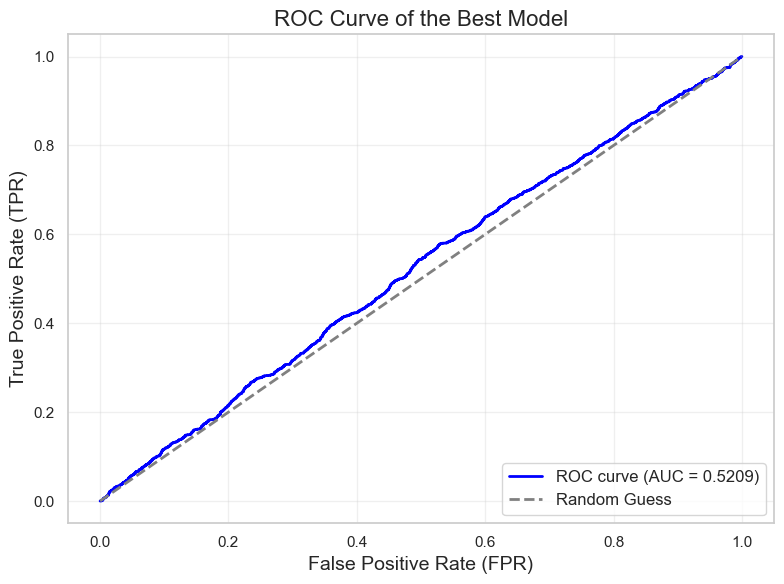

最优模型的 AUC: 0.5209


In [140]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 确保最优模型存在
if best_model is None:
    print("未找到最优模型，请确认是否完成训练！")
else:
    # 使用最优模型预测测试集概率
    best_test_probs = best_model.predict_proba(X_test)[:, 1]  # 提取正类概率
    fpr, tpr, thresholds = roc_curve(y_test, best_test_probs)  # 计算 FPR 和 TPR
    roc_auc = auc(fpr, tpr)  # 计算 AUC

    # 绘制 ROC 曲线
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label='Random Guess')  # 对角线
    plt.title('ROC Curve of the Best Model', fontsize=16)
    plt.xlabel('False Positive Rate (FPR)', fontsize=14)
    plt.ylabel('True Positive Rate (TPR)', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 输出 AUC
    print(f"最优模型的 AUC: {roc_auc:.4f}")


最重要的 10 个特征：
                             Feature  Coefficient
26                            height    -0.002170
25                             width     0.001551
27                      gross_weight     0.000807
24                            length    -0.000391
0                      policy_tenure     0.000239
28               is_front_fog_lights     0.000061
14            is_adjustable_steering     0.000057
16                 is_parking_camera    -0.000044
35  is_driver_seat_height_adjustable     0.000043
32                   is_brake_assist     0.000042


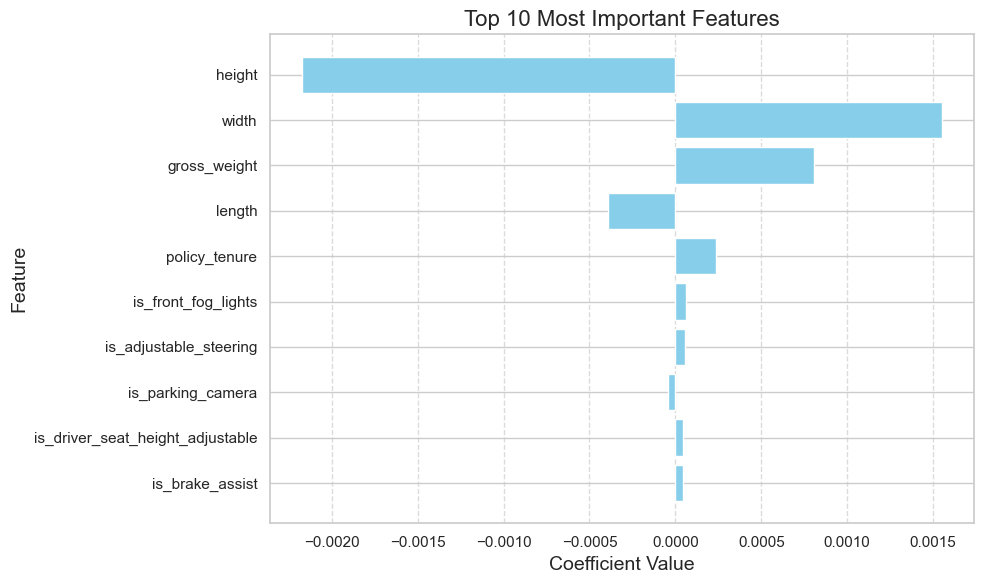

In [142]:
i# 确保模型已被训练
if best_model is None:
    print("未找到最优模型，请确认是否完成训练！")
else:
    # 获取特征名称和对应的系数
    feature_names = X_train.columns
    coefficients = best_model.coef_[0]  # 获取逻辑回归的系数
    feature_importance = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    })

    # 取绝对值排序，选出最重要的 10 个特征
    top_features = feature_importance.reindex(feature_importance['Coefficient'].abs().sort_values(ascending=False).index).head(10)

    # 打印最重要的 10 个特征
    print("\n最重要的 10 个特征：")
    print(top_features)

    # 可视化最重要的 10 个特征
    plt.figure(figsize=(10, 6))
    plt.barh(top_features['Feature'], top_features['Coefficient'], color='skyblue')
    plt.xlabel('Coefficient Value', fontsize=14)
    plt.ylabel('Feature', fontsize=14)
    plt.title('Top 10 Most Important Features', fontsize=16)
    plt.gca().invert_yaxis()  # 反转Y轴，让最重要特征在顶部
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

### 基于XGBoost

In [80]:
import time
import pandas as pd
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier

# 参数网格
param_grid = {
    'max_depth': [3, 5, 7],               # 树的最大深度
    'min_child_weight': [1, 3, 5],        # 最小子节点权重
    'gamma': [0, 0.1, 0.2],               # 分裂的最小损失减少
    'learning_rate': [0.01, 0.1, 0.2],    # 学习率（eta）
    'n_estimators': [50, 100, 150],       # 树的数量
    'subsample': [0.8, 1.0],              # 样本采样比例
    'colsample_bytree': [0.8, 1.0],       # 特征采样比例
    'lambda': [1, 2, 3],                  # L2 正则化项
    'alpha': [0, 0.1, 0.5]                # L1 正则化项
}

# 初始化结果存储
results = []

# 记录开始时间
start_time = time.time()

# 手动网格搜索
for max_depth in param_grid['max_depth']:
    for min_child_weight in param_grid['min_child_weight']:
        for gamma in param_grid['gamma']:
            for learning_rate in param_grid['learning_rate']:
                for n_estimators in param_grid['n_estimators']:
                    for subsample in param_grid['subsample']:
                        for colsample_bytree in param_grid['colsample_bytree']:
                            for reg_lambda in param_grid['lambda']:
                                for reg_alpha in param_grid['alpha']:
                                    # 初始化 XGBoost 模型
                                    model = XGBClassifier(
                                        max_depth=max_depth,
                                        min_child_weight=min_child_weight,
                                        gamma=gamma,
                                        learning_rate=learning_rate,
                                        n_estimators=n_estimators,
                                        subsample=subsample,
                                        colsample_bytree=colsample_bytree,
                                        reg_lambda=reg_lambda,
                                        reg_alpha=reg_alpha,
                                        use_label_encoder=False,  # 兼容性设置
                                        eval_metric='logloss',    # 评估指标
                                        random_state=42
                                    )
                                    
                                    # 在训练集上训练模型
                                    model.fit(X_train, y_train)
                                    
                                    # 在验证集上评估性能
                                    val_probs = model.predict_proba(X_val)[:, 1]  # 提取正类概率
                                    val_auc = roc_auc_score(y_val, val_probs)     # 验证集 AUC
                                    
                                    # 存储结果
                                    results.append({
                                        'max_depth': max_depth,
                                        'min_child_weight': min_child_weight,
                                        'gamma': gamma,
                                        'learning_rate': learning_rate,
                                        'n_estimators': n_estimators,
                                        'subsample': subsample,
                                        'colsample_bytree': colsample_bytree,
                                        'lambda': reg_lambda,
                                        'alpha': reg_alpha,
                                        'val_auc': val_auc
                                    })

# 转为 DataFrame
results_df = pd.DataFrame(results)

# 找到最佳参数组合
best_result = results_df.loc[results_df['val_auc'].idxmax()]
best_params = best_result[['max_depth', 'min_child_weight', 'gamma', 'learning_rate', 
                           'n_estimators', 'subsample', 'colsample_bytree', 'lambda', 'alpha']].to_dict()
best_auc = best_result['val_auc']

# 记录结束时间
end_time = time.time()
elapsed_time = end_time - start_time

# 输出结果
print(f"最佳参数: {best_params}")
print(f"验证集 AUC（最佳参数模型）: {best_auc:.4f}")
print(f"超参数搜索总耗时: {elapsed_time:.2f} 秒")

/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [16:54:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [16:54:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [16:54:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [16:54:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa

最佳参数: {'max_depth': 7.0, 'min_child_weight': 1.0, 'gamma': 0.1, 'learning_rate': 0.2, 'n_estimators': 150.0, 'subsample': 0.8, 'colsample_bytree': 1.0, 'lambda': 1.0, 'alpha': 0.5}
验证集 AUC（最佳参数模型）: 0.9702
超参数搜索总耗时: 2328.24 秒


In [82]:
# 输出调参过程的所有参数组合及其验证集 AUC
print("\n调参过程中的参数组合及其验证集 AUC：")
print(results_df.sort_values(by='val_auc', ascending=False).to_string(index=False))


调参过程中的参数组合及其验证集 AUC：
 max_depth  min_child_weight  gamma  learning_rate  n_estimators  subsample  colsample_bytree  lambda  alpha  val_auc
         7                 1    0.1           0.20           150        0.8               1.0       1    0.5 0.970195
         7                 1    0.1           0.20           150        0.8               0.8       1    0.5 0.969779
         7                 1    0.2           0.20           150        0.8               1.0       2    0.0 0.969763
         7                 1    0.0           0.20           150        0.8               1.0       1    0.1 0.969757
         7                 1    0.0           0.20           150        0.8               1.0       1    0.5 0.969750
         7                 1    0.2           0.20           150        0.8               1.0       2    0.1 0.969743
         7                 1    0.0           0.20           150        0.8               1.0       2    0.5 0.969649
         7                 1    0.

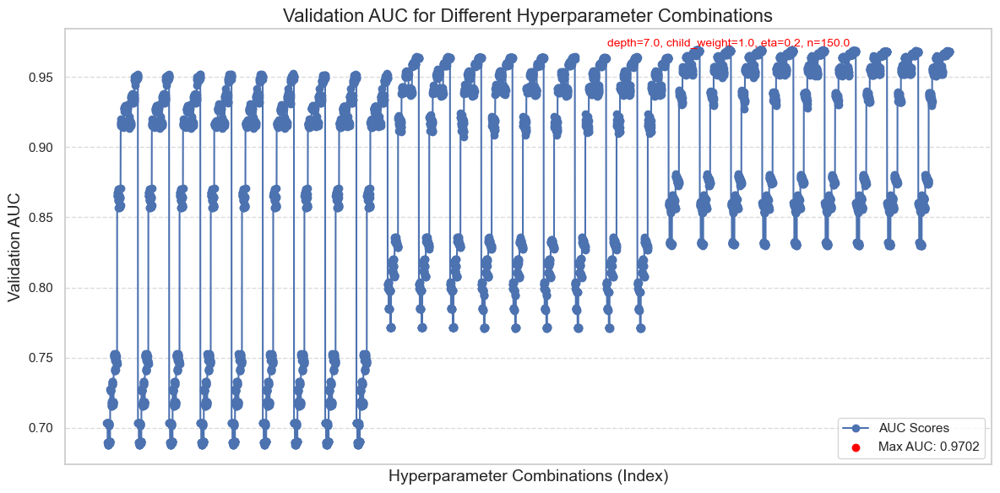

In [84]:
import matplotlib.pyplot as plt

# 提取参数组合及其 AUC
x_labels = results_df.apply(
    lambda row: f"depth={row['max_depth']}, child_weight={row['min_child_weight']}, "
                f"eta={row['learning_rate']}, n={row['n_estimators']}", axis=1
)
auc_scores = results_df['val_auc']

# 找到最佳 AUC 和对应参数组合
best_idx = auc_scores.idxmax()
best_auc = auc_scores[best_idx]
best_label = x_labels[best_idx]

# 绘制 AUC 连线图
plt.figure(figsize=(12, 6))
plt.plot(range(len(auc_scores)), auc_scores, marker='o', linestyle='-', label="AUC Scores")
plt.scatter(best_idx, best_auc, color='red', label=f"Max AUC: {best_auc:.4f}")
plt.text(best_idx, best_auc + 0.002, f"{best_label}", fontsize=10, color='red', ha='center')
plt.title("Validation AUC for Different Hyperparameter Combinations", fontsize=16)
plt.xlabel("Hyperparameter Combinations (Index)", fontsize=14)
plt.ylabel("Validation AUC", fontsize=14)
plt.xticks([])  # 隐藏横轴具体组合
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

In [108]:

# 使用最优参数初始化 XGBoost 模型
model = XGBClassifier(
    max_depth=int(best_params['max_depth']),                   
    n_estimators=int(best_params['n_estimators']),             
    min_child_weight=int(best_params['min_child_weight']),     
    learning_rate=best_params['learning_rate'],                
    gamma=best_params['gamma'],                                
    subsample=best_params['subsample'],                        
    colsample_bytree=best_params['colsample_bytree'],          
    reg_lambda=best_params['lambda'],                          
    reg_alpha=best_params['alpha'],                            
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

# 半监督学习参数
confidence_threshold = 0.9  # 初始高置信度阈值
max_iterations = 10  # 最大迭代次数
early_stop_rounds = 5  # 连续未提升轮次数的终止条件
no_improve_count = 0  # 未提升轮次计数
performance_metrics = []  # 存储每轮的性能指标

best_model = None  # 保存最优模型
best_iteration = -1  # 保存最优轮次
best_auc = 0  # 保存最高 AUC

In [110]:
for iteration in range(1, max_iterations + 1):
    print(f"\n=== 第 {iteration} 轮迭代 ===")
    
    # 1. 训练模型
    model.fit(X_train, y_train)
    
    # 2. 测试集性能评估
    test_probs = model.predict_proba(X_test)[:, 1]  # 提取正类概率
    test_predictions = model.predict(X_test)  # 分类结果
    test_auc = roc_auc_score(y_test, test_probs)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_confusion = confusion_matrix(y_test, test_predictions)
    test_report = classification_report(y_test, test_predictions, output_dict=True)
    
    print(f"\n测试集性能：")
    print(f"准确率={test_accuracy:.4f}, AUC={test_auc:.4f}")
    print(f"混淆矩阵：\n{test_confusion}")
    print(classification_report(y_test, test_predictions))
    
    # 3. 在无标签数据上生成伪标签
    unlabeled_probs = model.predict_proba(X_unlabeled)
    unlabeled_predictions = model.predict(X_unlabeled)
    high_confidence_mask = (unlabeled_probs.max(axis=1) >= confidence_threshold)
    high_confidence_samples = X_unlabeled[high_confidence_mask]
    high_confidence_labels = unlabeled_predictions[high_confidence_mask]
    
    print(f"可信伪标签样本数量：{len(high_confidence_samples)}")
    
    # 如果没有高置信度样本，提前停止迭代
    if len(high_confidence_samples) == 0:
        print("无高置信度伪标签样本，提前停止迭代。")
        break
    
    # 4. 扩展训练集
    X_train = pd.concat([X_train, high_confidence_samples], axis=0)
    y_train = pd.concat([y_train, pd.Series(high_confidence_labels, index=high_confidence_samples.index)], axis=0)
    
    # 5. 存储当前轮次性能指标
    performance_metrics.append({
        'iteration': iteration,
        'test_accuracy': test_accuracy,
        'test_auc': test_auc,
        'precision': test_report['1']['precision'],  # 正类的精确率
        'recall': test_report['1']['recall'],        # 正类的召回率
        'f1_score': test_report['1']['f1-score'],   # 正类的 F1-score
        'high_confidence_samples': len(high_confidence_samples)
    })
    
    # 6. 检查性能提升
    if test_auc > best_auc:
        best_auc = test_auc
        best_model = model
        best_iteration = iteration
        no_improve_count = 0  # 重置未提升计数
    else:
        no_improve_count += 1  # 增加未提升计数
        print(f"模型性能未提升，连续未提升轮次：{no_improve_count}")
    
    # 7. 检查终止条件
    if no_improve_count >= early_stop_rounds:
        print("模型连续两轮未提升，提前终止迭代。")
        break

# 输出每轮性能指标
performance_df = pd.DataFrame(performance_metrics)
print("\n每轮性能指标：")
print(performance_df)

# 输出最优模型和轮次
print(f"\n最优模型出现在第 {best_iteration} 轮，AUC={best_auc:.4f}")


=== 第 1 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:07] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.8198, AUC=0.9139
混淆矩阵：
[[9486  582]
 [3089 7217]]
              precision    recall  f1-score   support

           0       0.75      0.94      0.84     10068
           1       0.93      0.70      0.80     10306

    accuracy                           0.82     20374
   macro avg       0.84      0.82      0.82     20374
weighted avg       0.84      0.82      0.82     20374

可信伪标签样本数量：25800

=== 第 2 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.8432, AUC=0.9306
混淆矩阵：
[[9589  479]
 [2715 7591]]
              precision    recall  f1-score   support

           0       0.78      0.95      0.86     10068
           1       0.94      0.74      0.83     10306

    accuracy                           0.84     20374
   macro avg       0.86      0.84      0.84     20374
weighted avg       0.86      0.84      0.84     20374

可信伪标签样本数量：27121

=== 第 3 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.8551, AUC=0.9361
混淆矩阵：
[[9663  405]
 [2548 7758]]
              precision    recall  f1-score   support

           0       0.79      0.96      0.87     10068
           1       0.95      0.75      0.84     10306

    accuracy                           0.86     20374
   macro avg       0.87      0.86      0.85     20374
weighted avg       0.87      0.86      0.85     20374

可信伪标签样本数量：28198

=== 第 4 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9309, AUC=0.9705
混淆矩阵：
[[10006    62]
 [ 1346  8960]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.93     10068
           1       0.99      0.87      0.93     10306

    accuracy                           0.93     20374
   macro avg       0.94      0.93      0.93     20374
weighted avg       0.94      0.93      0.93     20374

可信伪标签样本数量：31367

=== 第 5 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9279, AUC=0.9699
混淆矩阵：
[[9989   79]
 [1389 8917]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.93     10068
           1       0.99      0.87      0.92     10306

    accuracy                           0.93     20374
   macro avg       0.93      0.93      0.93     20374
weighted avg       0.94      0.93      0.93     20374

可信伪标签样本数量：31910
模型性能未提升，连续未提升轮次：1

=== 第 6 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:14] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9294, AUC=0.9700
混淆矩阵：
[[9992   76]
 [1363 8943]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.93     10068
           1       0.99      0.87      0.93     10306

    accuracy                           0.93     20374
   macro avg       0.94      0.93      0.93     20374
weighted avg       0.94      0.93      0.93     20374

可信伪标签样本数量：32379
模型性能未提升，连续未提升轮次：2

=== 第 7 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:15] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9226, AUC=0.9687
混淆矩阵：
[[9987   81]
 [1496 8810]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93     10068
           1       0.99      0.85      0.92     10306

    accuracy                           0.92     20374
   macro avg       0.93      0.92      0.92     20374
weighted avg       0.93      0.92      0.92     20374

可信伪标签样本数量：32746
模型性能未提升，连续未提升轮次：3

=== 第 8 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9241, AUC=0.9692
混淆矩阵：
[[9990   78]
 [1469 8837]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93     10068
           1       0.99      0.86      0.92     10306

    accuracy                           0.92     20374
   macro avg       0.93      0.92      0.92     20374
weighted avg       0.93      0.92      0.92     20374

可信伪标签样本数量：33140
模型性能未提升，连续未提升轮次：4

=== 第 9 轮迭代 ===


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:50:18] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



测试集性能：
准确率=0.9232, AUC=0.9685
混淆矩阵：
[[9980   88]
 [1477 8829]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93     10068
           1       0.99      0.86      0.92     10306

    accuracy                           0.92     20374
   macro avg       0.93      0.92      0.92     20374
weighted avg       0.93      0.92      0.92     20374

可信伪标签样本数量：33520
模型性能未提升，连续未提升轮次：5
模型连续两轮未提升，提前终止迭代。

每轮性能指标：
   iteration  test_accuracy  test_auc  precision    recall  f1_score  \
0          1       0.819819  0.913945   0.925375  0.700272  0.797238   
1          2       0.843232  0.930567   0.940644  0.736561  0.826186   
2          3       0.855060  0.936073   0.950386  0.752765  0.840110   
3          4       0.930892  0.970529   0.993128  0.869396  0.927152   
4          5       0.927947  0.969949   0.991218  0.865224  0.923946   
5          6       0.929371  0.969961   0.991573  0.867747  0.925537   
6          7       0.922597  0.968750   0.99

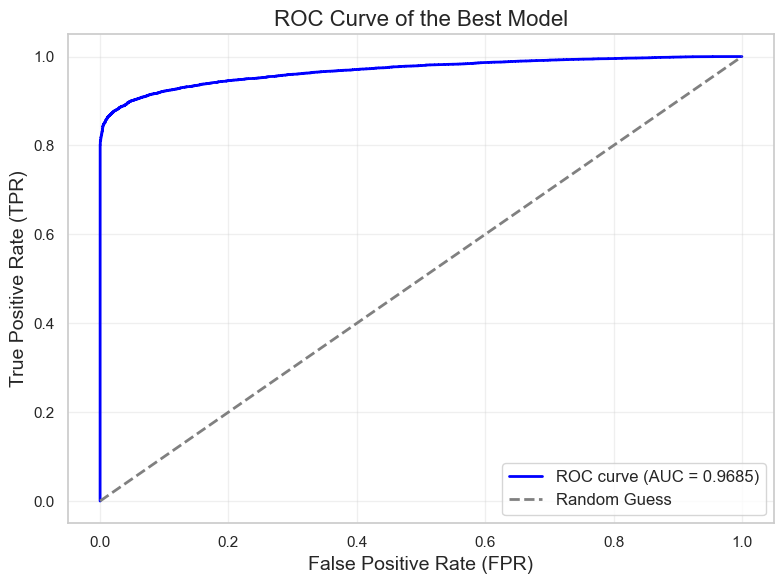

最优模型的 AUC: 0.9685


In [112]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 确保最优模型已被保存
if best_model is None:
    print("未找到最优模型，请确认是否执行了模型训练和参数搜索！")
else:
    # 使用最优模型预测测试集概率
    best_test_probs = best_model.predict_proba(X_test)[:, 1]  # 提取正类概率
    fpr, tpr, thresholds = roc_curve(y_test, best_test_probs)  # 计算 FPR 和 TPR
    roc_auc = auc(fpr, tpr)  # 计算 AUC

    # 绘制 ROC 曲线
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label='Random Guess')  # 对角线
    plt.title('ROC Curve of the Best Model', fontsize=16)
    plt.xlabel('False Positive Rate (FPR)', fontsize=14)
    plt.ylabel('True Positive Rate (TPR)', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"最优模型的 AUC: {roc_auc:.4f}")

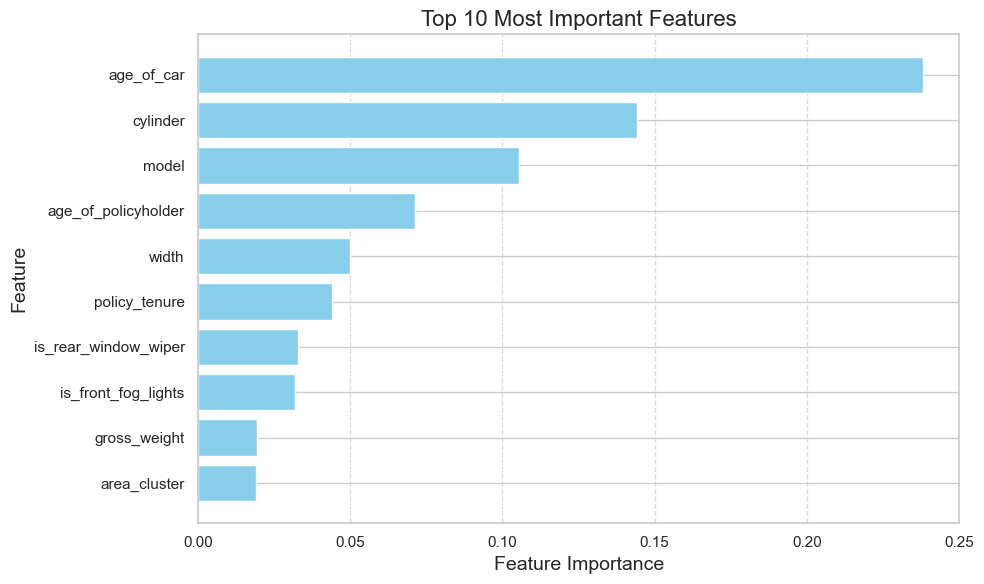

Top 10 Most Important Features:
                 Feature  Importance
1             age_of_car    0.238184
19              cylinder    0.144265
7                  model    0.105597
2    age_of_policyholder    0.071114
25                 width    0.049979
0          policy_tenure    0.043944
29  is_rear_window_wiper    0.032733
28   is_front_fog_lights    0.031998
27          gross_weight    0.019498
3           area_cluster    0.019072


In [114]:
# 提取特征重要性
feature_importances = best_model.feature_importances_  # 提取最优模型的特征重要性
features = X_train.columns  # 获取特征名称

# 创建一个 DataFrame 存储特征及其重要性
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# 按重要性降序排序，并取前 10 个特征
top_10_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

# 可视化最重要的 10 个特征
plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # 反转 y 轴，使最重要的特征在顶部
plt.title('Top 10 Most Important Features', fontsize=16)
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 打印最重要的 10 个特征
print("Top 10 Most Important Features:")
print(top_10_features)

### 基于LightGBM

In [ ]:
import time
import pandas as pd
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score

# 参数网格
param_grid = {
    'n_estimators': [50, 75, 100, 150, 200],  # 树的数量
    'max_depth': [5, 10, 15, -1],             # 最大深度（-1 表示无约束）
    'learning_rate': [0.01, 0.1, 0.2],        # 学习率
    'num_leaves': [15, 31, 63],               # 叶节点数
    'min_child_samples': [10, 20, 30],        # 每个叶子节点的最小样本数
    'subsample': [0.8, 1.0],                  # 数据采样比例
    'colsample_bytree': [0.8, 1.0],           # 特征采样比例
    'reg_lambda': [0.0, 1.0, 2.0],            # L2 正则化
    'reg_alpha': [0.0, 0.1, 0.5]              # L1 正则化
}

# 初始化结果存储
results = []

# 记录开始时间
start_time = time.time()

# 手动网格搜索
for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for learning_rate in param_grid['learning_rate']:
            for num_leaves in param_grid['num_leaves']:
                for min_child_samples in param_grid['min_child_samples']:
                    for subsample in param_grid['subsample']:
                        for colsample_bytree in param_grid['colsample_bytree']:
                            for reg_lambda in param_grid['reg_lambda']:
                                for reg_alpha in param_grid['reg_alpha']:
                                    # 初始化 LightGBM 模型
                                    model = LGBMClassifier(
                                        n_estimators=n_estimators,
                                        max_depth=max_depth,
                                        learning_rate=learning_rate,
                                        num_leaves=num_leaves,
                                        min_child_samples=min_child_samples,
                                        subsample=subsample,
                                        colsample_bytree=colsample_bytree,
                                        reg_lambda=reg_lambda,
                                        reg_alpha=reg_alpha,
                                        random_state=42
                                    )
                                    
                                    # 在训练集上训练模型
                                    model.fit(X_train, y_train)
                                    
                                    # 在验证集上评估性能
                                    val_probs = model.predict_proba(X_val)[:, 1]  # 提取正类概率
                                    val_auc = roc_auc_score(y_val, val_probs)  # 验证集 AUC
                                    
                                    # 存储结果
                                    results.append({
                                        'n_estimators': n_estimators,
                                        'max_depth': max_depth,
                                        'learning_rate': learning_rate,
                                        'num_leaves': num_leaves,
                                        'min_child_samples': min_child_samples,
                                        'subsample': subsample,
                                        'colsample_bytree': colsample_bytree,
                                        'reg_lambda': reg_lambda,
                                        'reg_alpha': reg_alpha,
                                        'val_auc': val_auc
                                    })

# 转为 DataFrame
results_df = pd.DataFrame(results)

# 找到最佳参数组合
best_result = results_df.loc[results_df['val_auc'].idxmax()]
best_params = best_result[['n_estimators', 'max_depth', 'learning_rate', 'num_leaves', 
                           'min_child_samples', 'subsample', 'colsample_bytree', 'reg_lambda', 'reg_alpha']].to_dict()
best_auc = best_result['val_auc']

# 记录结束时间
end_time = time.time()
elapsed_time = end_time - start_time

# 输出结果
print(f"最佳参数: {best_params}")
print(f"验证集 AUC（最佳参数模型）: {best_auc:.4f}")
print(f"超参数搜索总耗时: {elapsed_time:.2f} 秒")

[LightGBM] [Info] Number of positive: 30509, number of negative: 497701
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2507
[LightGBM] [Info] Number of data points in the train set: 528210, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.057759 -> initscore=-2.791978
[LightGBM] [Info] Start training from score -2.791978
[LightGBM] [Info] Number of positive: 30509, number of negative: 497701
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2507
[LightGBM] [Info] Number of data points in the train set: 528210, number of used features: 39
[LightGBM] [In

In [84]:
import time
import pandas as pd
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score

# 参数网格（优化后）
param_grid = {
    'n_estimators': [50, 100, 150],       # 树的数量
    'max_depth': [5, 10],                 # 最大深度
    'learning_rate': [0.05, 0.1],         # 学习率
    'num_leaves': [15, 31],               # 叶节点数
    'min_child_samples': [10, 20],        # 每个叶子节点的最小样本数
    'subsample': [0.8, 1.0],              # 数据采样比例
    'colsample_bytree': [0.8],            # 特征采样比例（固定）
    'reg_lambda': [0.0, 1.0],             # L2 正则化
    'reg_alpha': [0.0, 0.1]               # L1 正则化
}

# 初始化结果存储
results = []

# 记录开始时间
start_time = time.time()

# 手动网格搜索
for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for learning_rate in param_grid['learning_rate']:
            for num_leaves in param_grid['num_leaves']:
                for min_child_samples in param_grid['min_child_samples']:
                    for subsample in param_grid['subsample']:
                        for reg_lambda in param_grid['reg_lambda']:
                            for reg_alpha in param_grid['reg_alpha']:
                                # 初始化 LightGBM 模型
                                model = LGBMClassifier(
                                    n_estimators=n_estimators,
                                    max_depth=max_depth,
                                    learning_rate=learning_rate,
                                    num_leaves=num_leaves,
                                    min_child_samples=min_child_samples,
                                    subsample=subsample,
                                    colsample_bytree=0.8,  # 固定值
                                    reg_lambda=reg_lambda,
                                    reg_alpha=reg_alpha,
                                    random_state=42
                                )
                                
                                # 在训练集上训练模型
                                model.fit(X_train, y_train)
                                
                                # 在验证集上评估性能
                                val_probs = model.predict_proba(X_val)[:, 1]  # 提取正类概率
                                val_auc = roc_auc_score(y_val, val_probs)  # 验证集 AUC
                                
                                # 存储结果
                                results.append({
                                    'n_estimators': n_estimators,
                                    'max_depth': max_depth,
                                    'learning_rate': learning_rate,
                                    'num_leaves': num_leaves,
                                    'min_child_samples': min_child_samples,
                                    'subsample': subsample,
                                    'reg_lambda': reg_lambda,
                                    'reg_alpha': reg_alpha,
                                    'val_auc': val_auc
                                })

# 转为 DataFrame
results_df = pd.DataFrame(results)

# 找到最佳参数组合
best_result = results_df.loc[results_df['val_auc'].idxmax()]
best_params = best_result[['n_estimators', 'max_depth', 'learning_rate', 'num_leaves', 
                           'min_child_samples', 'subsample', 'reg_lambda', 'reg_alpha']].to_dict()
best_auc = best_result['val_auc']

# 记录结束时间
end_time = time.time()
elapsed_time = end_time - start_time

# 输出结果
print(f"最佳参数: {best_params}")
print(f"验证集 AUC（最佳参数模型）: {best_auc:.4f}")
print(f"超参数搜索总耗时: {elapsed_time:.2f} 秒")

[LightGBM] [Info] Number of positive: 30594, number of negative: 30528
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5169
[LightGBM] [Info] Number of data points in the train set: 61122, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500540 -> initscore=0.002160
[LightGBM] [Info] Start training from score 0.002160
[LightGBM] [Info] Number of positive: 30594, number of negative: 30528
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5169
[LightGBM] [Info] Number of data points in the train set: 61122, number of used features: 39
[LightGBM] [Info] [b

In [88]:
# 打印所有超参数组合及其 AUC
print("\n调参过程中的参数组合及其验证集 AUC：")
print(results_df.sort_values(by='val_auc', ascending=False).to_string(index=False))


调参过程中的参数组合及其验证集 AUC：
 n_estimators  max_depth  learning_rate  num_leaves  min_child_samples  subsample  reg_lambda  reg_alpha  val_auc
          150         10           0.10          31                 10        0.8         0.0        0.0 0.973636
          150         10           0.10          31                 10        1.0         0.0        0.0 0.973636
          150         10           0.10          31                 10        1.0         0.0        0.1 0.973527
          150         10           0.10          31                 10        0.8         0.0        0.1 0.973527
          150         10           0.10          31                 10        1.0         1.0        0.1 0.973486
          150         10           0.10          31                 10        0.8         1.0        0.1 0.973486
          150         10           0.10          31                 20        1.0         0.0        0.1 0.973483
          150         10           0.10          31               

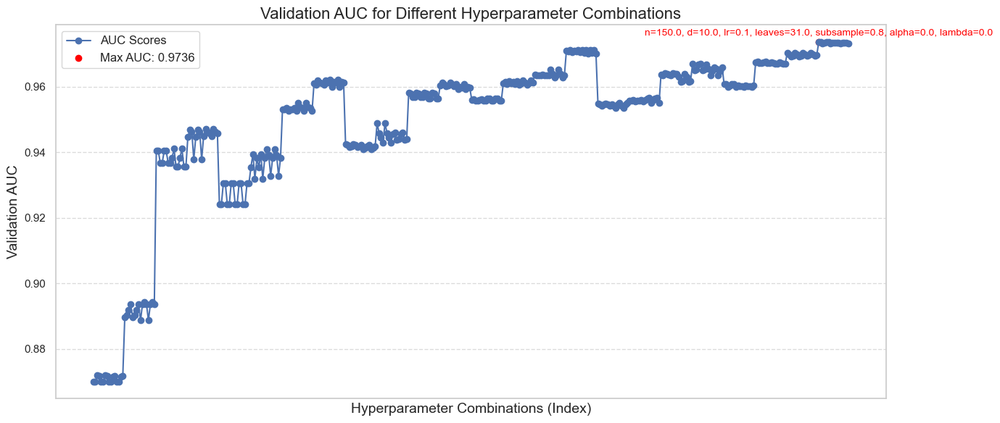

In [90]:
# 提取参数组合及其 AUC
x_labels = results_df.apply(
    lambda row: f"n={row['n_estimators']}, d={row['max_depth']}, lr={row['learning_rate']}, "
                f"leaves={row['num_leaves']}, subsample={row['subsample']}, alpha={row['reg_alpha']}, "
                f"lambda={row['reg_lambda']}", axis=1
)
auc_scores = results_df['val_auc']

# 找到最佳 AUC 和对应参数组合
best_idx = auc_scores.idxmax()
best_auc = auc_scores[best_idx]
best_label = x_labels[best_idx]

# 绘制 AUC 图形
plt.figure(figsize=(14, 6))
plt.plot(range(len(auc_scores)), auc_scores, marker='o', linestyle='-', label="AUC Scores")
plt.scatter(best_idx, best_auc, color='red', label=f"Max AUC: {best_auc:.4f}")
plt.text(best_idx, best_auc + 0.002, f"{best_label}", fontsize=10, color='red', ha='center')
plt.title("Validation AUC for Different Hyperparameter Combinations", fontsize=16)
plt.xlabel("Hyperparameter Combinations (Index)", fontsize=14)
plt.ylabel("Validation AUC", fontsize=14)
plt.xticks([])  # 隐藏横轴索引
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [106]:
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, classification_report
import pandas as pd

# 使用最优参数初始化 LightGBM 模型
model = LGBMClassifier(
    n_estimators=int(best_params['n_estimators']),         # 强制转换为整型
    max_depth=int(best_params['max_depth']),
    learning_rate=best_params['learning_rate'],
    num_leaves=int(best_params['num_leaves']),
    min_child_samples=int(best_params['min_child_samples']),
    subsample=best_params['subsample'],
    colsample_bytree=0.8,  # 固定特征采样比例
    reg_lambda=best_params['reg_lambda'],
    reg_alpha=best_params['reg_alpha'],
    random_state=42
)

# 半监督学习参数
confidence_threshold = 0.9  # 初始高置信度阈值
max_iterations = 10  # 最大迭代次数
early_stop_rounds = 5  # 连续未提升轮次数的终止条件
no_improve_count = 0  # 未提升轮次计数
performance_metrics = []  # 存储每轮的性能指标

best_model = None  # 保存最优模型
best_iteration = -1  # 保存最优轮次
best_auc = 0  # 保存最高 AUC

In [108]:
for iteration in range(1, max_iterations + 1):
    print(f"\n=== 第 {iteration} 轮迭代 ===")
    
    # 1. 训练模型
    model.fit(X_train, y_train)
    
    # 2. 测试集性能评估
    test_probs = model.predict_proba(X_test)[:, 1]  # 提取正类概率
    test_predictions = model.predict(X_test)  # 分类结果
    test_auc = roc_auc_score(y_test, test_probs)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_confusion = confusion_matrix(y_test, test_predictions)
    test_report = classification_report(y_test, test_predictions, output_dict=True)
    
    print(f"\n测试集性能：")
    print(f"准确率={test_accuracy:.4f}, AUC={test_auc:.4f}")
    print(f"混淆矩阵：\n{test_confusion}")
    print(classification_report(y_test, test_predictions))
    
    # 3. 在无标签数据上生成伪标签
    unlabeled_probs = model.predict_proba(X_unlabeled)
    unlabeled_predictions = model.predict(X_unlabeled)
    high_confidence_mask = (unlabeled_probs.max(axis=1) >= confidence_threshold)
    high_confidence_samples = X_unlabeled[high_confidence_mask]
    high_confidence_labels = unlabeled_predictions[high_confidence_mask]
    
    print(f"可信伪标签样本数量：{len(high_confidence_samples)}")
    
    # 如果没有高置信度样本，提前停止迭代
    if len(high_confidence_samples) == 0:
        print("无高置信度伪标签样本，提前停止迭代。")
        break
    
    # 4. 扩展训练集
    X_train = pd.concat([X_train, high_confidence_samples], axis=0)
    y_train = pd.concat([y_train, pd.Series(high_confidence_labels, index=high_confidence_samples.index)], axis=0)
    
    # 5. 存储当前轮次性能指标
    performance_metrics.append({
        'iteration': iteration,
        'test_accuracy': test_accuracy,
        'test_auc': test_auc,
        'precision': test_report['1']['precision'],  # 正类的精确率
        'recall': test_report['1']['recall'],        # 正类的召回率
        'f1_score': test_report['1']['f1-score'],   # 正类的 F1-score
        'high_confidence_samples': len(high_confidence_samples)
    })
    
    # 6. 检查性能提升
    if test_auc > best_auc:
        best_auc = test_auc
        best_model = model
        best_iteration = iteration
        no_improve_count = 0  # 重置未提升计数
    else:
        no_improve_count += 1  # 增加未提升计数
        print(f"模型性能未提升，连续未提升轮次：{no_improve_count}")
    
    # 7. 检查终止条件
    if no_improve_count >= early_stop_rounds:
        print("模型连续两轮未提升，提前终止迭代。")
        break
# 输出每轮性能指标
performance_df = pd.DataFrame(performance_metrics)
print("\n每轮性能指标：")
print(performance_df)

# 输出最优模型和轮次
print(f"\n最优模型出现在第 {best_iteration} 轮，AUC={best_auc:.4f}")


=== 第 1 轮迭代 ===
[LightGBM] [Info] Number of positive: 30594, number of negative: 403924
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2847
[LightGBM] [Info] Number of data points in the train set: 434518, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.070409 -> initscore=-2.580423
[LightGBM] [Info] Start training from score -2.580423

测试集性能：
准确率=0.9226, AUC=0.9669
混淆矩阵：
[[10156    78]
 [ 1499  8641]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93     10234
           1       0.99      0.85      0.92     10140

    accuracy                           0.92     20374
   macro avg       0.93      0.92      0.92     20374
weighted avg       0.93      0.92      0.92     20374

可信伪标签样本数量：34996

=== 第 2 轮迭代

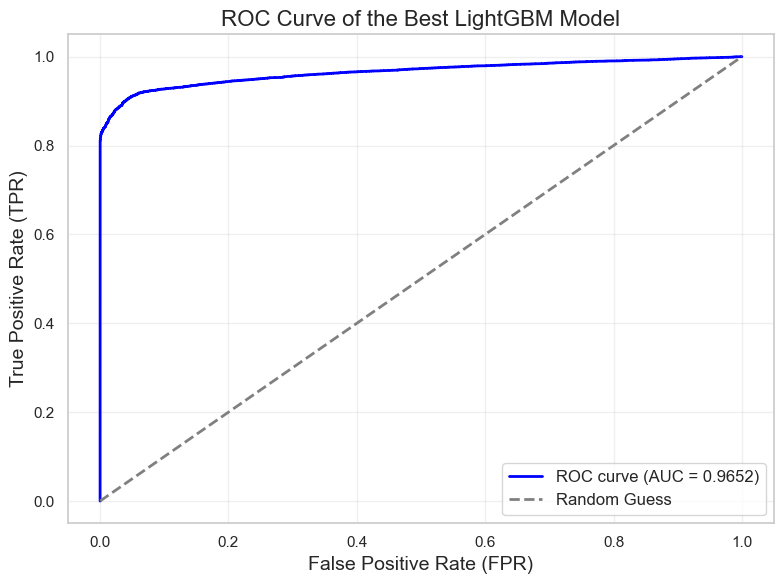

最优 LightGBM 模型的 AUC: 0.9652


In [114]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 确保最优模型已被保存
if best_model is None:
    print("未找到最优模型，请确认是否执行了模型训练和参数搜索！")
else:
    # 使用最优模型预测测试集概率
    best_test_probs = best_model.predict_proba(X_test)[:, 1]  # 提取正类概率
    fpr, tpr, thresholds = roc_curve(y_test, best_test_probs)  # 计算 FPR 和 TPR
    roc_auc = auc(fpr, tpr)  # 计算 AUC

    # 绘制 ROC 曲线
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label='Random Guess')  # 对角线
    plt.title('ROC Curve of the Best LightGBM Model', fontsize=16)
    plt.xlabel('False Positive Rate (FPR)', fontsize=14)
    plt.ylabel('True Positive Rate (TPR)', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 输出 AUC 值
    print(f"最优 LightGBM 模型的 AUC: {roc_auc:.4f}")

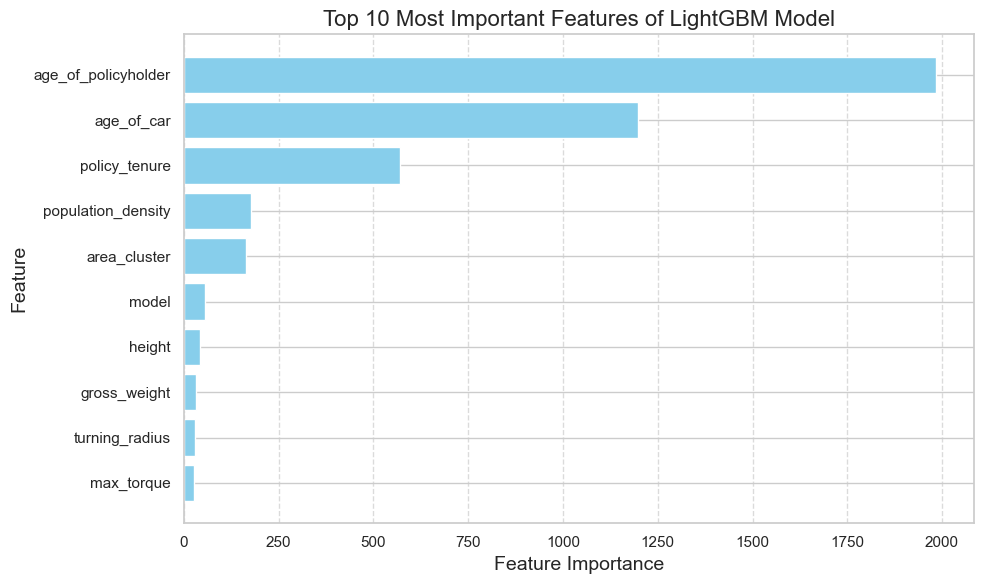

Top 10 Most Important Features:
                Feature  Importance
2   age_of_policyholder        1985
1            age_of_car        1199
0         policy_tenure         569
4    population_density         178
3          area_cluster         163
7                 model          56
26               height          43
27         gross_weight          32
23       turning_radius          29
9            max_torque          26


In [116]:
# 提取特征重要性
feature_importances = best_model.feature_importances_  # 提取最优模型的特征重要性
features = X_train.columns  # 获取特征名称

# 创建一个 DataFrame 存储特征及其重要性
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# 按重要性降序排序，并取前 10 个特征
top_10_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

# 可视化最重要的 10 个特征
plt.figure(figsize=(10, 6))
plt.barh(top_10_features['Feature'], top_10_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # 反转 y 轴，使最重要的特征在顶部
plt.title('Top 10 Most Important Features of LightGBM Model', fontsize=16)
plt.xlabel('Feature Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 打印最重要的 10 个特征
print("Top 10 Most Important Features:")
print(top_10_features)